<h4 Style="color:#2F4F4F"> Primero se instaló ydata profiling </h4>

In [1]:
import sys
!{sys.executable} -m pip install ydata-profiling

  Using cached ydata_profiling-4.7.0-py2.py3-none-any.whl.metadata (20 kB)
     ---------------------------------------- 0.0/107.3 kB ? eta -:--:--
     --- ------------------------------------ 10.2/107.3 kB ? eta -:--:--
     --- ------------------------------------ 10.2/107.3 kB ? eta -:--:--
     -------------- ---------------------- 41.0/107.3 kB 393.8 kB/s eta 0:00:01
     ---------------------------- -------- 81.9/107.3 kB 573.4 kB/s eta 0:00:01
     ---------------------------------- - 102.4/107.3 kB 653.6 kB/s eta 0:00:01
     ---------------------------------- - 102.4/107.3 kB 653.6 kB/s eta 0:00:01
     ------------------------------------ 107.3/107.3 kB 443.3 kB/s eta 0:00:00
  Using cached htmlmin-0.1.12-py3-none-any.whl
  Using cached multimethod-1.11.2-py3-none-any.whl.metadata (9.1 kB)
  Using cached typeguard-4.2.1-py3-none-any.whl.metadata (3.7 kB)
  Using cached dacite-1.8.1-py3-none-any.whl.metadata (15 kB)
  Using cached annotated_types-0.6.0-py3-none-any.whl.metada

  You can safely remove it manually.


<p Style="text-align: left"> 18/04/2024</p>

![Disquera.jpg](attachment:4a9b1620-6dcf-4c6c-987a-17a49a4abbf4.jpg)<center><img src='Disquera.jpg'>

<h4 Style="text-align: center;color : #708090"> Proyecto: Canciones con potencial de Hit en el medio nacional. </h4>

<p Style="text-align: justify"> El siguiente trabajo es el resultado de la investigación y análisis de datos 
realizada con el objetivo de determinar, a partir de datos históricos, las canciones que tienen potencial de convertirse en Hit en el medio local, de tal forma que se pueda potencial el objetivo de la empresa Disquera Mundial que consiste en promocionar canciones de diferentes artistas urbanos. </p>

</br>

<table>
    <tr>
        <td><img src="informacion.png"></td>
        <td>
            <a href="https://www.kaggle.com/datasets/yasserh/song-popularity-dataset?resource=download">Fuente de los datos</a>        </td>
        <td>
        <p>Este es un repositorio donde se encuentra el set de datos  utilizado en el proyecto, el cual correponde a data  histórica sobre canciones del medio local.
        </p>
        </td>
    </tr>
</table>

<h4 Style="color:#009000"> 1. Se importó las librerías requeridas para esta sección del proyecto</h4>

<p Style="text-align: justify"> Lo primero fue darle un upgrade a la biblioteca numpy para poder cargar lapack_lite que es necesario al momento de llamar las librerías y que no arroje un error de instalación. </p>

In [2]:
!pip install --upgrade numpy scipy scikit-learn ydata_profiling

  Using cached scipy-1.13.0-cp311-cp311-win_amd64.whl.metadata (60 kB)
  Using cached scikit_learn-1.4.2-cp311-cp311-win_amd64.whl.metadata (11 kB)
Using cached scikit_learn-1.4.2-cp311-cp311-win_amd64.whl (10.6 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2


<p Style="text-align: justify"> Posteriormente se cargó las librerías indicadas. </p>

In [2]:
%matplotlib inline
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import linear_model
from sklearn.metrics import r2_score

<p Style="text-align: justify"> Para poder llamar el ydata_profiling se tuvo que hacer algunas actualizaciones previamente. </p>

In [3]:
!pip install --upgrade numba

In [4]:
!pip install --upgrade visions

In [5]:
from ydata_profiling import ProfileReport

<h4 Style="color:#009000"> 2. Se importó el dataset del  proyecto</h4>

In [6]:
dfmusica = pd.read_excel("Datasetcancionesarreglado.xlsx")

<h4 Style="color:#009000"> 3. Preparación del dataset</h4>

<h4 Style="color:#008080"> 3.1 Se revisó que el dataset tenga encabezados en cada columna</h4>

In [7]:
dfmusica.head(6)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
0,Boulevard of Broken Dreams,73.0,262333.0,0.005520,0.496,0.682,0.000029,8.0,0.0589,-4.095,1.0,0.0294,167.060,4.0,0.474
1,In The End,66.0,216933.0,0.010300,0.542,0.853,0.000000,3.0,0.1080,-6.407,0.0,0.0498,105.256,4.0,0.370
2,Seven Nation Army,76.0,231733.0,0.008170,0.737,0.463,0.447000,0.0,0.2550,-7.828,1.0,0.0792,123.881,4.0,0.324
3,By The Way,74.0,216933.0,0.026400,0.451,0.970,0.003550,0.0,0.1020,-4.938,1.0,0.1070,122.444,4.0,0.198
4,How You Remind Me,56.0,223826.0,0.000954,0.447,0.766,0.000000,10.0,0.1130,-5.065,1.0,0.0313,172.011,4.0,0.574
5,Bring Me To Life,80.0,235893.0,0.008950,0.316,0.945,0.000002,4.0,0.3960,-3.169,0.0,0.1240,189.931,4.0,0.320


<h4 Style="color:#008080"> 3.2 Se revisó cuántas filas y columnas tiene el dataset</h4>

In [8]:
dfmusica.shape

#18835 filas y 14 columnas 

(18835, 15)

<h4 Style="color:#008080"> 3.3 Se revisó estadísticamente el dataset</h4>

In [9]:
dfmusica.describe() 

,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
count,18437.000000,1.843600e+04,18497.000000,18762.000000,18813.000000,18826.000000,18827.000000,18599.000000,18827.000000,18433.000000,18763.000000,18454.000000,18445.000000,18448.000000
mean,52.901014,2.181774e+05,0.459837,0.659468,0.644292,0.089861,5.178620,0.182035,-7.264181,0.629523,26.115696,120.877098,3.956519,0.526243
std,21.899035,6.004593e+04,3.595003,1.351437,0.214631,0.235417,3.648935,0.152107,3.991646,0.482946,3562.320470,29.083024,0.314399,0.244433
min,0.000000,2.900000e+01,0.000001,0.000000,0.000247,0.000000,0.000000,0.000000,-38.768000,0.000000,0.000000,0.026900,0.000000,0.000000
25%,40.000000,1.842440e+05,0.024400,0.528000,0.509000,0.000000,2.000000,0.092800,-8.964000,0.000000,0.037600,98.258500,4.000000,0.333000
50%,55.000000,2.112530e+05,0.133000,0.641000,0.674000,0.000014,5.000000,0.122000,-6.491000,1.000000,0.055400,120.014000,4.000000,0.524000
75%,69.000000,2.428675e+05,0.430000,0.747000,0.814000,0.004030,8.000000,0.223000,-4.813000,1.000000,0.121000,139.932750,4.000000,0.723000
max,100.000000,1.799346e+06,88.000000,74.000000,0.999000,0.997000,11.000000,1.000000,11.000000,1.000000,487960.000000,242.318000,5.000000,0.984000


<h4 Style="color:#008080"> 3.4 Se verificó que 14 columnas tengan valores numéricos</h4>

In [10]:
dfmusica.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18835 entries, 0 to 18834
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_name         18835 non-null  object 
 1   song_popularity   18437 non-null  float64
 2   song_duration_ms  18436 non-null  float64
 3   acousticness      18497 non-null  float64
 4   danceability      18762 non-null  float64
 5   energy            18813 non-null  float64
 6   instrumentalness  18826 non-null  float64
 7   key               18827 non-null  float64
 8   liveness          18599 non-null  float64
 9   loudness          18827 non-null  float64
 10  audio_mode        18433 non-null  float64
 11  speechiness       18763 non-null  float64
 12  tempo             18454 non-null  float64
 13  time_signature    18445 non-null  float64
 14  audio_valence     18448 non-null  float64
dtypes: float64(14), object(1)
memory usage: 2.2+ MB


<h4 Style="color:#008080"> 3.5 Se revisó el nombre de los encabezados para estandarizar los que tengan nombre o formato equivocado</h4>

In [11]:
dfmusica.columns 

Index(['song_name', 'song_popularity', 'song_duration_ms', 'acousticness',
       'danceability', 'energy', 'instrumentalness', 'key', 'liveness',
       'loudness', 'audio_mode', 'speechiness', 'tempo', 'time_signature',
       'audio_valence'],
      dtype='object')

<h4 Style="color:#008080"> 3.6 Se intervino el dataset y se borró valores de cada columna porque no coincidían con lo que en materia musical se espera, de la siguiente forma:
    </h4>
    
    a) Song popularity. Esta variable es una calificación de 0% a 100%, por lo tanto, valores fuera de ese rango se eliminaron.
    
    b) Song duration ms. Se eliminó los valores que no son numéricos.
    
    c) Acousticness. Los valores normales en esta variable van de 0 a 1, por lo tanto se eliminó aquellos datos que se salen de ese rango.
    
    d) Danceability. Los valores normales en esta variable van de 0 a 1, por lo tanto se eliminó aquellos datos que se salen de ese rango.
    
    e) Energy. Los valores normales en esta variable van de 0 a 1, por lo tanto se eliminó aquellos datos que se salen de ese rango.
    
    f) Instrumentalness. Evalúa que tan instrumental es la canción. Los valoes esperados van entre 0 y 1 y por lo tanto se eliminó los valores que no cumplan ese criterio.
    
    g) Key. Esta variable mide los acordes de la canción  (Do, Re, Mi, etc)y por lo tanto deben estar entre 1 y 11. Se eliminó los valores que estén por fuera de ese rango. Asimismo esta variable se debe convertir en entero porque no hay medios acordes en la escala musical.
   
    h) Liveness. Esta variable lo que define es la probabilidad de que la canción haya sido grabada en vivo. Y va de 0 a 1, por lo tanto se eliminó los valores superiores a 1.
    
    i)Loudness son los decibeles de la canción. No existe una escala estándar pero si se sabe que va entre valores negativos, pasando por 0 como valor de referencia y también tiene valores positivos dependiendo de la intensidad del sonido. En este caso no se eliminó ningún dato.
   
    j) Audio mode. Esta variable tiene que ver con la tonalidad de la canción y lo normal es que tome valores de 0 o 1. No deben haber valores intermedios. Por lo tanto se eliminó todo valor diferente a 0 y 1.
    
    k) Speechness. Esta variable tiene que ver con cuanto de la canción es cantado y cuanto es solo música.Esta toma valor entre 0 y 1, siendo 0 totalmente cantada y 0 es completamente instrumental.Por lo tanto se eliminó aquellos valores que están por debajo de 0 y por encima de 1.
    
    l) Tempo. Esta variable se refiere a la velocidad o ritmo de la canción. Se suele encontrar en un rango de valores entre 60 y 200 BPM Beats Per Minute. Por lo tanto se eliminó aquellos valores por debajo de 60 y por encima de 200.
    
    m) Time signature. Esta variables tiene que ver con compases. Ejemplo( 4/4) cuatro cuartos, (3/4) tres cuartos, (6/8) seis octavos. Por lo tanto, los valores observados no siguen la convención tradicional. Dado esto, se eliminó los valores decimales.
    
    n) Audio valence. Esta variable explica la valencia emocional de la canción. O sea que tan positiva o negativa es percibida una canción. Los valores normales van de 0 a 1, siendo 0.5 un punto neutro. Por lo tanto se eliminó los valores menores a 0 y superiores a 1
    
    Los que se hizo más adelante fue imputar valores numéricos en los espacios que se borró del dataset. Esto por cuanto se valoró que ingresar promedios no afectaría los resultados.
    
    No se borró filas del dataframe porque los valores inconsistentes no están en una sola fila sino en varias y la combinación de eliminaciones si afectaría el tamaño de los datos para el análisis


<h4 Style="color:#008080"> 3.6 Se corrigió los encabezados para mantener un estándar</h4>

In [12]:
dfmusica.rename({"song_name":"Songname"}, axis=1, inplace=True)
dfmusica.rename({"song_popularity":"Songpopularity"}, axis=1, inplace=True)
dfmusica.rename({"song_duration_ms":"Songdurationmilliseconds"}, axis=1, inplace=True)
dfmusica.rename({"acousticness":"Acousticness"}, axis=1, inplace=True)
dfmusica.rename({"danceability":"Danceability"}, axis=1, inplace=True)
dfmusica.rename({"energy":"Energy"}, axis=1, inplace=True)
dfmusica.rename({"instrumentalness":"Instrumentalness"}, axis=1, inplace=True)
dfmusica.rename({"key":"Key"}, axis=1, inplace=True)
dfmusica.rename({"liveness":"Liveness"}, axis=1, inplace=True)
dfmusica.rename({"loudness":"Loudness"}, axis=1, inplace=True)
dfmusica.rename({"audio_mode":"Audiomode"}, axis=1, inplace=True)
dfmusica.rename({"speechiness":"Speechness"}, axis=1, inplace=True)
dfmusica.rename({"time_signature":"Timesignature"}, axis=1, inplace=True)
dfmusica.rename({"audio_valence":"Audiovalence"}, axis=1, inplace=True)
dfmusica.rename({"tempo":"Tempo"}, axis=1, inplace=True)

In [13]:
dfmusica.columns 

Index(['Songname', 'Songpopularity', 'Songdurationmilliseconds',
       'Acousticness', 'Danceability', 'Energy', 'Instrumentalness', 'Key',
       'Liveness', 'Loudness', 'Audiomode', 'Speechness', 'Tempo',
       'Timesignature', 'Audiovalence'],
      dtype='object')

<h4 Style="color:#008080"> 3.7 Se revisó las primeras filas para ver las correcciones aplicadas</h4>

In [14]:
dfmusica.head(5)

,Songname,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence
0,Boulevard of Broken Dreams,73.0,262333.0,0.005520,0.496,0.682,0.000029,8.0,0.0589,-4.095,1.0,0.0294,167.060,4.0,0.474
1,In The End,66.0,216933.0,0.010300,0.542,0.853,0.000000,3.0,0.1080,-6.407,0.0,0.0498,105.256,4.0,0.370
2,Seven Nation Army,76.0,231733.0,0.008170,0.737,0.463,0.447000,0.0,0.2550,-7.828,1.0,0.0792,123.881,4.0,0.324
3,By The Way,74.0,216933.0,0.026400,0.451,0.970,0.003550,0.0,0.1020,-4.938,1.0,0.1070,122.444,4.0,0.198
4,How You Remind Me,56.0,223826.0,0.000954,0.447,0.766,0.000000,10.0,0.1130,-5.065,1.0,0.0313,172.011,4.0,0.574


<h4 Style="color:#008080"> 3.8 Se le aplicó un borrado a los valores NaN, en caso de que existan en el dataframe</h4>

In [15]:
dfmusica.replace('?', np.nan, inplace = True)
dfmusica.head(6)

,Songname,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence
0,Boulevard of Broken Dreams,73.0,262333.0,0.005520,0.496,0.682,0.000029,8.0,0.0589,-4.095,1.0,0.0294,167.060,4.0,0.474
1,In The End,66.0,216933.0,0.010300,0.542,0.853,0.000000,3.0,0.1080,-6.407,0.0,0.0498,105.256,4.0,0.370
2,Seven Nation Army,76.0,231733.0,0.008170,0.737,0.463,0.447000,0.0,0.2550,-7.828,1.0,0.0792,123.881,4.0,0.324
3,By The Way,74.0,216933.0,0.026400,0.451,0.970,0.003550,0.0,0.1020,-4.938,1.0,0.1070,122.444,4.0,0.198
4,How You Remind Me,56.0,223826.0,0.000954,0.447,0.766,0.000000,10.0,0.1130,-5.065,1.0,0.0313,172.011,4.0,0.574
5,Bring Me To Life,80.0,235893.0,0.008950,0.316,0.945,0.000002,4.0,0.3960,-3.169,0.0,0.1240,189.931,4.0,0.320


<h4 Style="color:#008080"> 3.9  Se hizo un conteo de valores faltantes. Para ello se generó un dataframe temporal con los valores "Falso" y "Verdadero", siendo NaN el valor verdadero, para luego proceder al conteo. Los campos donde aparece True son los faltante</h4>

In [16]:
dfTemp = dfmusica.isnull()
dfTemp.head(30)

,Songname,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [17]:
for clum in dfTemp.columns.values.tolist():
    print(clum)
    print(dfTemp[clum].value_counts())
    print("")

Songname
Songname
False    18835
Name: count, dtype: int64

Songpopularity
Songpopularity
False    18437
True       398
Name: count, dtype: int64

Songdurationmilliseconds
Songdurationmilliseconds
False    18436
True       399
Name: count, dtype: int64

Acousticness
Acousticness
False    18497
True       338
Name: count, dtype: int64

Danceability
Danceability
False    18762
True        73
Name: count, dtype: int64

Energy
Energy
False    18813
True        22
Name: count, dtype: int64

Instrumentalness
Instrumentalness
False    18826
True         9
Name: count, dtype: int64

Key
Key
False    18827
True         8
Name: count, dtype: int64

Liveness
Liveness
False    18599
True       236
Name: count, dtype: int64

Loudness
Loudness
False    18827
True         8
Name: count, dtype: int64

Audiomode
Audiomode
False    18433
True       402
Name: count, dtype: int64

Speechness
Speechness
False    18763
True        72
Name: count, dtype: int64

Tempo
Tempo
False    18454
True       381
Name:

<h4 Style="color:#008080"> 3.10  Se imputó valores numéricos para las variables a las que se les borró información por ser inconsistente. En su lugar se ingresó el promedio de los datos</h4>

In [18]:
#Valores flotantes:

avSongpopularity = dfmusica['Songpopularity'].astype("float").mean(axis=0)
dfmusica["Songpopularity"].replace(np.nan, avSongpopularity, inplace=True)

avSongdurationmilliseconds = dfmusica['Songdurationmilliseconds'].astype("float").mean(axis=0)
dfmusica["Songdurationmilliseconds"].replace(np.nan, avSongdurationmilliseconds, inplace=True)

avAcousticness = dfmusica['Acousticness'].astype("float").mean(axis=0)
dfmusica["Acousticness"].replace(np.nan, avAcousticness, inplace=True)

avDanceability = dfmusica['Danceability'].astype("float").mean(axis=0)
dfmusica["Danceability"].replace(np.nan, avDanceability, inplace=True)

avEnergy = dfmusica['Energy'].astype("float").mean(axis=0)
dfmusica["Energy"].replace(np.nan, avEnergy, inplace=True)

avInstrumentalness = dfmusica['Instrumentalness'].astype("float").mean(axis=0)
dfmusica["Instrumentalness"].replace(np.nan, avInstrumentalness, inplace=True)

avKey = dfmusica['Key'].astype("float").mean(axis=0)
dfmusica["Key"].replace(np.nan, avKey, inplace=True)

avLiveness = dfmusica['Liveness'].astype("float").mean(axis=0)
dfmusica["Liveness"].replace(np.nan, avLiveness, inplace=True)

avLoudness = dfmusica['Loudness'].astype("float").mean(axis=0)
dfmusica["Loudness"].replace(np.nan, avLoudness, inplace=True)

avAudiomode = dfmusica['Audiomode'].astype("float").mean(axis=0)
dfmusica["Audiomode"].replace(np.nan, avAudiomode, inplace=True)

avSpeechness = dfmusica['Speechness'].astype("float").mean(axis=0)
dfmusica["Speechness"].replace(np.nan, avSpeechness, inplace=True)

avTempo = dfmusica['Tempo'].astype("float").mean(axis=0)
dfmusica["Tempo"].replace(np.nan, avTempo, inplace=True)

avTimesignature = dfmusica['Timesignature'].astype("float").mean(axis=0)
dfmusica["Timesignature"].replace(np.nan, avTimesignature, inplace=True)

avAudiovalence = dfmusica['Audiovalence'].astype("float").mean(axis=0)
dfmusica["Audiovalence"].replace(np.nan, avAudiovalence, inplace=True)

#Valores enteros:

dfmusica[["Timesignature"]] = dfmusica[["Timesignature"]].astype("int")

dfmusica[["Key"]] = dfmusica[["Key"]].astype("int")


In [19]:
dfTemp = dfmusica.isnull()
for clum in dfTemp.columns.values.tolist():
    print(clum)
    print(dfTemp[clum].value_counts())
    print("")

Songname
Songname
False    18835
Name: count, dtype: int64

Songpopularity
Songpopularity
False    18835
Name: count, dtype: int64

Songdurationmilliseconds
Songdurationmilliseconds
False    18835
Name: count, dtype: int64

Acousticness
Acousticness
False    18835
Name: count, dtype: int64

Danceability
Danceability
False    18835
Name: count, dtype: int64

Energy
Energy
False    18835
Name: count, dtype: int64

Instrumentalness
Instrumentalness
False    18835
Name: count, dtype: int64

Key
Key
False    18835
Name: count, dtype: int64

Liveness
Liveness
False    18835
Name: count, dtype: int64

Loudness
Loudness
False    18835
Name: count, dtype: int64

Audiomode
Audiomode
False    18835
Name: count, dtype: int64

Speechness
Speechness
False    18835
Name: count, dtype: int64

Tempo
Tempo
False    18835
Name: count, dtype: int64

Timesignature
Timesignature
False    18835
Name: count, dtype: int64

Audiovalence
Audiovalence
False    18835
Name: count, dtype: int64



<h4 Style="color:#008080"> 3.11  Se verificó nuevamente el dataframe.</h4>

In [20]:
dfmusica.describe()

,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence
count,18835.000000,1.883500e+04,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000
mean,52.901014,2.181774e+05,0.459837,0.659468,0.644292,0.089861,5.174834,0.182035,-7.264181,0.629523,26.115696,120.877098,3.936714,0.526243
std,21.666414,5.940649e+04,3.562599,1.348815,0.214506,0.235361,3.653063,0.151151,3.990798,0.477764,3555.504800,28.787355,0.339637,0.241909
min,0.000000,2.900000e+01,0.000001,0.000000,0.000247,0.000000,0.000000,0.000000,-38.768000,0.000000,0.000000,0.026900,0.000000,0.000000
25%,41.000000,1.849610e+05,0.025400,0.529000,0.510000,0.000000,2.000000,0.093200,-8.963000,0.000000,0.037600,98.990000,4.000000,0.337000
50%,55.000000,2.121740e+05,0.140000,0.642000,0.674000,0.000014,5.000000,0.123000,-6.492000,1.000000,0.055800,120.175000,4.000000,0.526243
75%,68.000000,2.419100e+05,0.455000,0.747000,0.813500,0.004060,8.000000,0.220000,-4.814500,1.000000,0.122000,139.464500,4.000000,0.718000
max,100.000000,1.799346e+06,88.000000,74.000000,0.999000,0.997000,11.000000,1.000000,11.000000,1.000000,487960.000000,242.318000,5.000000,0.984000


In [21]:
dfmusica.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18835 entries, 0 to 18834
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Songname                  18835 non-null  object 
 1   Songpopularity            18835 non-null  float64
 2   Songdurationmilliseconds  18835 non-null  float64
 3   Acousticness              18835 non-null  float64
 4   Danceability              18835 non-null  float64
 5   Energy                    18835 non-null  float64
 6   Instrumentalness          18835 non-null  float64
 7   Key                       18835 non-null  int32  
 8   Liveness                  18835 non-null  float64
 9   Loudness                  18835 non-null  float64
 10  Audiomode                 18835 non-null  float64
 11  Speechness                18835 non-null  float64
 12  Tempo                     18835 non-null  float64
 13  Timesignature             18835 non-null  int32  
 14  Audiov

In [22]:
dfmusica.iloc[1]

Songname                    In The End
Songpopularity                    66.0
Songdurationmilliseconds      216933.0
Acousticness                    0.0103
Danceability                     0.542
Energy                           0.853
Instrumentalness                   0.0
Key                                  3
Liveness                         0.108
Loudness                        -6.407
Audiomode                          0.0
Speechness                      0.0498
Tempo                          105.256
Timesignature                        4
Audiovalence                      0.37
Name: 1, dtype: object

In [23]:
dfmusica.iloc[:1, :]

,Songname,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence
0,Boulevard of Broken Dreams,73.0,262333.0,0.00552,0.496,0.682,0.000029,8,0.0589,-4.095,1.0,0.0294,167.06,4,0.474


<h4 Style="color:#008080"> 3.12  Se normalizó las siguientes variables: </h4>

a. Songpopularity(Norm). Se convirtió a porcentaje porque la variable estaba en datos absolutos.

b. Songdurationmilliseconds(Norm). En esta se dividió el monto entre mil para obtener la duración en segundos.
.</h4>

In [24]:
dfmusica['Songpopularity(Norm)'] = dfmusica['Songpopularity']/100
dfmusica['Songdurationseconds(Norm)'] = dfmusica['Songdurationmilliseconds']/1000

In [25]:
dfmusica.iloc[:1, :]

,Songname,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence,Songpopularity(Norm),Songdurationseconds(Norm)
0,Boulevard of Broken Dreams,73.0,262333.0,0.00552,0.496,0.682,0.000029,8,0.0589,-4.095,1.0,0.0294,167.06,4,0.474,0.73,262.333


In [26]:
profile = ProfileReport(dfmusica, title="fast_EDA")

<h4 Style="color:#008080"> 3.13  Se hizo una revisión rápida con ydata profiling </h4>

In [27]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<h4 Style="color:#008080"> 3.14  Se hizo una revisión y borrado de outliers, variable por variable </h4>

<h4 Style="color:#006600"> Songpopularity. Valores normales entre 0 y 100</h4>

In [28]:
minimo = 0
maximo = 100

<h4 Style="color:#006600"> Los valores atípicos para esta variable son:</h4>

In [29]:
atipicos = dfmusica["Songpopularity"][(dfmusica["Songpopularity"] > maximo) | (dfmusica["Songpopularity"] < minimo)]
print(atipicos)

Series([], Name: Songpopularity, dtype: float64)


<h4 Style="color:#008080"> Dado que no hay valores atípicos en esta variable, se decidió no intervenirla:</h4>

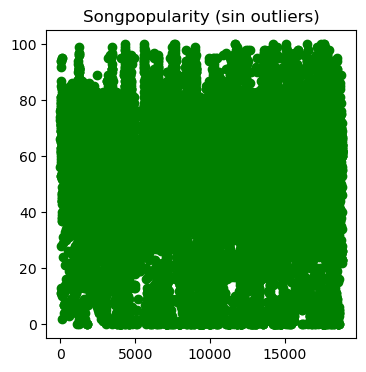

In [30]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(range(len(dfmusica)), dfmusica["Songpopularity"], color='g')
ax.set_title("Songpopularity (sin outliers)")
plt.show()

<h4 Style="color:#3333FF"> Songdurationmilliseconds. Valores normales entre 180 mil a 300 mil</h4>

In [31]:
minimo = 180000
maximo = 300000

<h4 Style="color:#3333FF"> Los valores atípicos para esta variable son:</h4>

In [32]:
atipicos_mayores = dfmusica["Songdurationmilliseconds"][dfmusica["Songdurationmilliseconds"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Songdurationmilliseconds"][dfmusica["Songdurationmilliseconds"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 300000 : 1255
24       304840.0
26       303920.0
28       311106.0
123      300026.0
125      338853.0
           ...   
18626    308569.0
18649    349319.0
18735    300706.0
18780    305000.0
18833    352280.0
Name: Songdurationmilliseconds, Length: 1255, dtype: float64

Valores menores a 180000 : 4010
10       168253.0
27       176346.0
35       178266.0
48       173680.0
51       175026.0
           ...   
18818    175777.0
18819    179067.0
18825    145466.0
18827    114582.0
18830    159645.0
Name: Songdurationmilliseconds, Length: 4010, dtype: float64


<h4 Style="color:#3333FF"> Identificación de outliers</h4>

<function matplotlib.pyplot.show(close=None, block=None)>

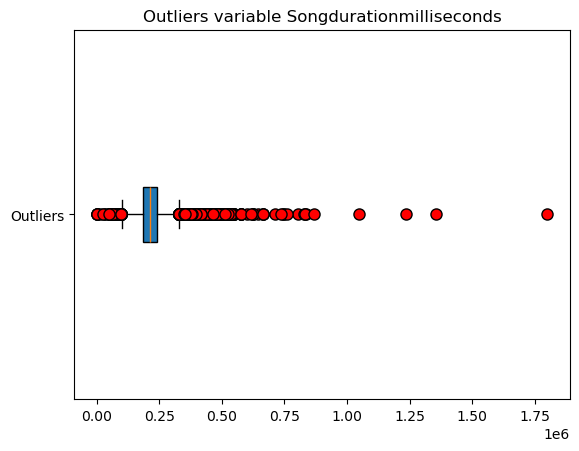

In [33]:
plt.boxplot(dfmusica["Songdurationmilliseconds"], vert=False, patch_artist=True, labels=["Outliers"], flierprops=dict(marker='o', markerfacecolor='r', markersize=8))
plt.title("Outliers variable Songdurationmilliseconds")
plt.show

<h4 Style="color:#3333FF"> Eliminación de outliers</h4>

In [34]:
Songdurationmilliseconds = dfmusica['Songdurationmilliseconds']
Q1 = Songdurationmilliseconds.quantile(.25)
Q3 = Songdurationmilliseconds.quantile(.75)
IIQ = Q3 - Q1
limite_inferior = Q1 - 1.5 * IIQ
limite_superior = Q3 + 1.5 * IIQ

In [35]:
seleccion = dfmusica[(dfmusica["Songdurationmilliseconds"] >= limite_inferior) & (dfmusica["Songdurationmilliseconds"] <= limite_superior)]


<h4 Style="color:#3333FF"> Nueva variable para el nuevo dataframe</h4>

In [36]:
dfmusica1 = dfmusica.loc[(dfmusica["Songdurationmilliseconds"] >= limite_inferior) & (dfmusica["Songdurationmilliseconds"] <= limite_superior)]

<h4 Style="color:#3333FF"> Revisión de la variable con y sin outliers</h4>

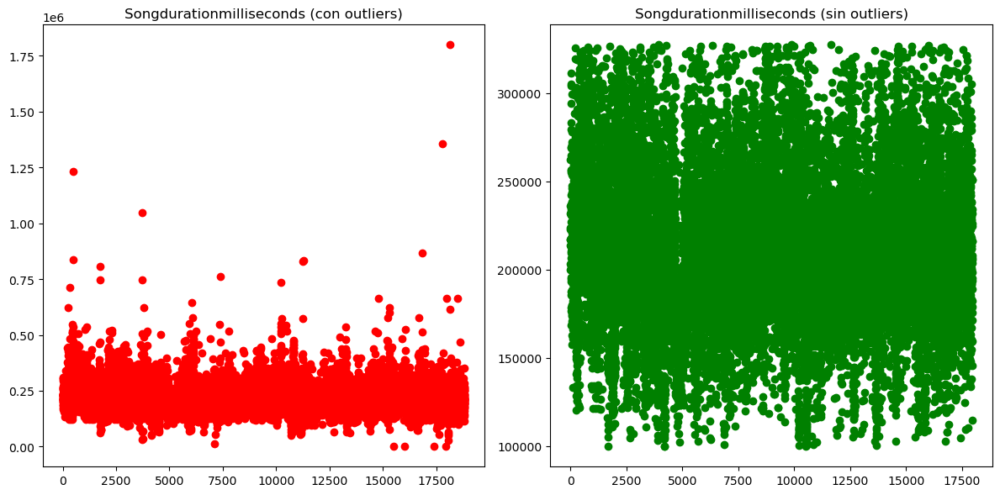

In [37]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].scatter(range(len(dfmusica)), dfmusica["Songdurationmilliseconds"], color='r')
axs[0].set_title("Songdurationmilliseconds (con outliers)")
axs[1].scatter(range(len(dfmusica1)), dfmusica1["Songdurationmilliseconds"], color='g')
axs[1].set_title("Songdurationmilliseconds (sin outliers)")
plt.tight_layout()
plt.show()

In [38]:
dfmusica1.describe()

,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence,Songpopularity(Norm),Songdurationseconds(Norm)
count,17970.000000,17970.000000,17970.000000,17970.000000,17970.000000,17970.000000,17970.000000,17970.000000,17970.000000,17970.000000,17970.000000,17970.000000,17970.000000,17970.000000,17970.000000,17970.000000
mean,53.203506,212327.641960,0.465962,0.662708,0.646249,0.080874,5.170562,0.181494,-7.162013,0.631305,27.367643,120.963367,3.937730,0.527229,0.532035,212.327642
std,21.654016,42063.411793,3.646515,1.380225,0.213158,0.223044,3.651054,0.149732,3.934817,0.477081,3640.072541,28.759035,0.337379,0.240852,0.216540,42.063412
min,0.000000,99759.000000,0.000001,0.000000,0.000247,0.000000,0.000000,0.000000,-38.768000,0.000000,0.000000,0.026900,0.000000,0.000000,0.000000,99.759000
25%,41.000000,184603.750000,0.025400,0.531000,0.513000,0.000000,2.000000,0.093200,-8.786000,0.000000,0.037600,99.075000,4.000000,0.339000,0.410000,184.603750
50%,55.000000,210886.500000,0.137000,0.644000,0.674000,0.000012,5.000000,0.123000,-6.415000,1.000000,0.055900,120.502500,4.000000,0.526243,0.550000,210.886500
75%,69.000000,237798.000000,0.446750,0.747000,0.815000,0.002770,8.000000,0.220000,-4.760250,1.000000,0.123000,139.539000,4.000000,0.718000,0.690000,237.798000
max,100.000000,327333.000000,88.000000,74.000000,0.999000,0.989000,11.000000,1.000000,11.000000,1.000000,487960.000000,242.318000,5.000000,0.984000,1.000000,327.333000


<h4 Style="color:#CC99"> Acousticness. Valores normales entre 0 a 1</h4>

In [39]:
minimo = 0
maximo = 1

<h4 Style="color:#CC99FF"> Los valores atípicos para esta variable son:</h4>

In [40]:
atipicos_mayores = dfmusica["Acousticness"][dfmusica["Acousticness"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Acousticness"][dfmusica["Acousticness"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 1 : 65
101      88.0
538      69.0
682      69.0
845      51.0
981      49.0
         ... 
15442    59.0
16013    58.0
16790    65.0
18489    88.0
18577    49.0
Name: Acousticness, Length: 65, dtype: float64

Valores menores a 0 : 0
Series([], Name: Acousticness, dtype: float64)


<h4 Style="color:#CC99FF"> Identificación de outliers</h4>

<function matplotlib.pyplot.show(close=None, block=None)>

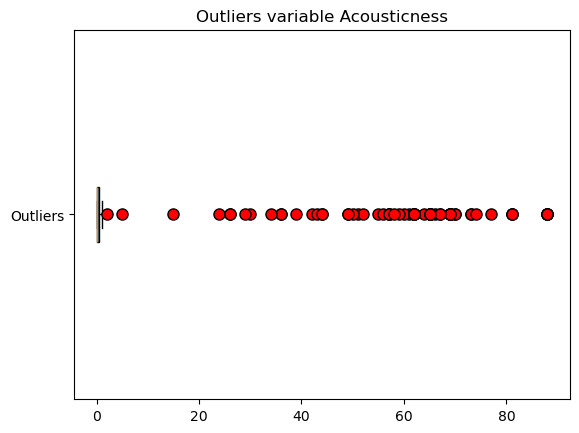

In [41]:
plt.boxplot(dfmusica["Acousticness"], vert=False, patch_artist=True, labels=["Outliers"], flierprops=dict(marker='o', markerfacecolor='r', markersize=8))
plt.title("Outliers variable Acousticness")
plt.show

<h4 Style="color:#CC99FF"> Eliminación de outliers</h4>

In [42]:
Acousticness = dfmusica['Acousticness']
Q1 = Acousticness.quantile(.25)
Q3 = Acousticness.quantile(.75)
IIQ = Q3 - Q1
limite_inferior = Q1 - 1.5 * IIQ
limite_superior = Q3 + 1.5 * IIQ

In [43]:
seleccion = dfmusica[(dfmusica["Acousticness"] >= limite_inferior) & (dfmusica["Acousticness"] <= limite_superior)]


<h4 Style="color:#CC99FF"> Nueva variable para el nuevo dataframe</h4>

In [44]:
dfmusica1 = dfmusica.loc[(dfmusica["Acousticness"] >= limite_inferior) & (dfmusica["Acousticness"] <= limite_superior)]

<h4 Style="color:#CC99FF"> Revisión de la variable con y sin outliers</h4>

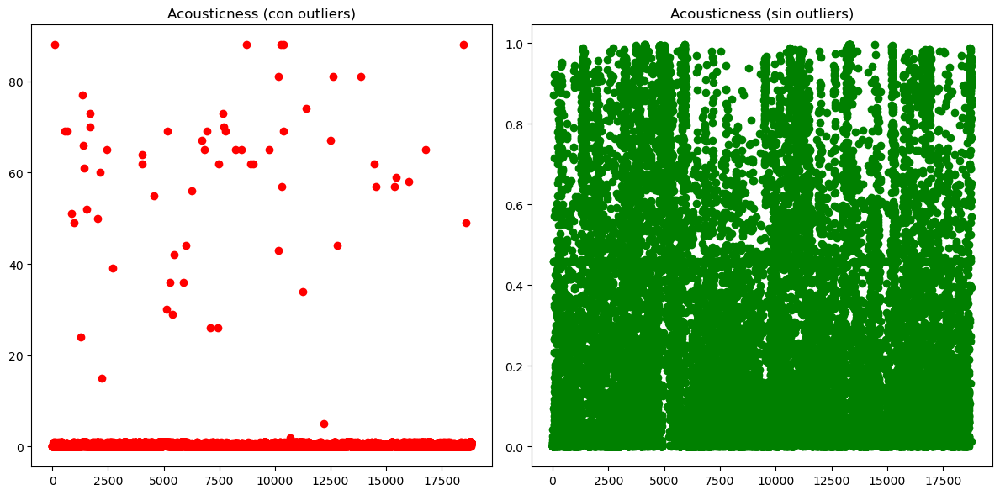

In [45]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].scatter(range(len(dfmusica)), dfmusica["Acousticness"], color='r')
axs[0].set_title("Acousticness (con outliers)")
axs[1].scatter(range(len(dfmusica1)), dfmusica1["Acousticness"], color='g')
axs[1].set_title("Acousticness (sin outliers)")
plt.tight_layout()
plt.show()

In [46]:
dfmusica1.describe()

,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence,Songpopularity(Norm),Songdurationseconds(Norm)
count,18770.000000,1.877000e+04,18770.000000,18770.000000,18770.000000,18770.000000,18770.000000,18770.000000,18770.000000,18770.000000,18770.000000,18770.000000,18770.000000,18770.000000,18770.000000,18770.000000
mean,52.914467,2.181774e+05,0.261962,0.659468,0.645643,0.087917,5.192754,0.182637,-7.308521,0.629523,26.115696,120.877098,3.939957,0.526271,0.529145,218.177386
std,21.688233,5.950926e+04,0.287169,1.351149,0.212965,0.233278,3.646646,0.151026,3.919285,0.478590,3561.656115,28.837160,0.335713,0.242297,0.216882,59.509263
min,0.000000,2.900000e+01,0.000001,0.000000,0.001070,0.000000,0.000000,0.000000,-38.768000,0.000000,0.000000,0.026900,0.000000,0.000000,0.000000,0.029000
25%,41.000000,1.848800e+05,0.025200,0.528000,0.512000,0.000000,2.000000,0.093400,-8.970000,0.000000,0.037600,98.970000,4.000000,0.337000,0.410000,184.880000
50%,55.000000,2.120025e+05,0.138000,0.641000,0.674000,0.000014,5.000000,0.123000,-6.501500,1.000000,0.055500,120.094000,4.000000,0.526243,0.550000,212.002500
75%,68.000000,2.420000e+05,0.451000,0.747000,0.814000,0.003787,8.000000,0.221000,-4.829000,1.000000,0.121000,139.653000,4.000000,0.719000,0.680000,242.000000
max,100.000000,1.799346e+06,0.996000,74.000000,0.999000,0.997000,11.000000,1.000000,1.585000,1.000000,487960.000000,242.318000,5.000000,0.984000,1.000000,1799.346000


<h4 Style="color:#FFA500"> Danceability. Valores normales entre 0 a 1</h4>

In [47]:
minimo = 0
maximo = 1

<h4 Style="color:#FFA500"> Los valores atípicos para esta variable son:</h4>

In [48]:
atipicos_mayores = dfmusica["Danceability"][dfmusica["Danceability"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Danceability"][dfmusica["Danceability"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 1 : 13
117     41.0
771     52.0
1325    45.0
2375    74.0
4990    24.0
6951    74.0
8097    60.0
8728    65.0
9187    63.0
9210    12.0
9244    48.0
9298    39.0
9835    29.0
Name: Danceability, dtype: float64

Valores menores a 0 : 0
Series([], Name: Danceability, dtype: float64)


<h4 Style="color:#FFA500"> Identificación de outliers</h4>

<function matplotlib.pyplot.show(close=None, block=None)>

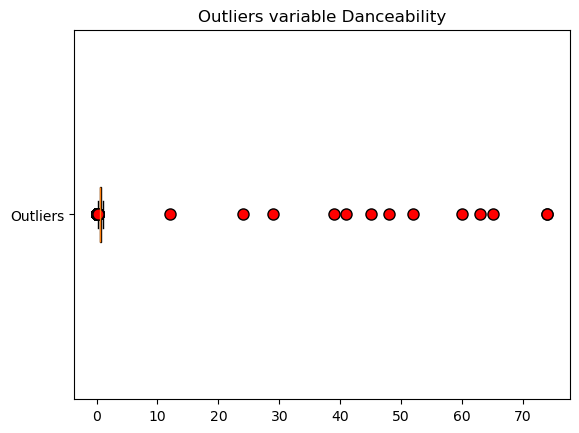

In [49]:
plt.boxplot(dfmusica["Danceability"], vert=False, patch_artist=True, labels=["Outliers"], flierprops=dict(marker='o', markerfacecolor='r', markersize=8))
plt.title("Outliers variable Danceability")
plt.show

<h4 Style="color:#FFA500"> Eliminación de outliers</h4>

In [50]:
Danceability = dfmusica['Danceability']
Q1 = Danceability.quantile(.25)
Q3 = Danceability.quantile(.75)
IIQ = Q3 - Q1
limite_inferior = Q1 - 1.5 * IIQ
limite_superior = Q3 + 1.5 * IIQ

In [51]:
seleccion = dfmusica[(dfmusica["Danceability"] >= limite_inferior) & (dfmusica["Danceability"] <= limite_superior)]


<h4 Style="color:#FFA500"> Nueva variable para el nuevo dataframe</h4>

In [52]:
dfmusica1 = dfmusica.loc[(dfmusica["Danceability"] >= limite_inferior) & (dfmusica["Danceability"] <= limite_superior)]

<h4 Style="color:#FFA500"> Revisión de la variable con y sin outliers</h4>

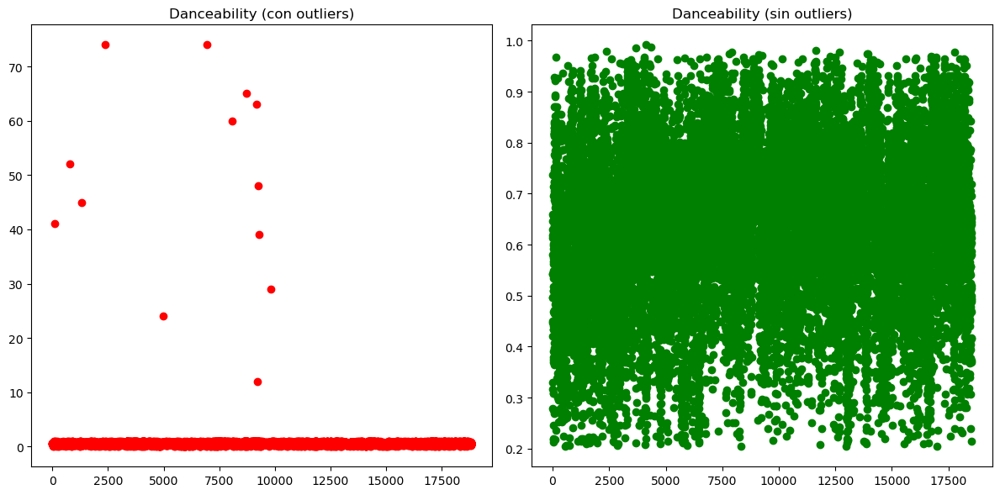

In [53]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].scatter(range(len(dfmusica)), dfmusica["Danceability"], color='r')
axs[0].set_title("Danceability (con outliers)")
axs[1].scatter(range(len(dfmusica1)), dfmusica1["Danceability"], color='g')
axs[1].set_title("Danceability (sin outliers)")
plt.tight_layout()
plt.show()

In [54]:
dfmusica1.describe()

,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence,Songpopularity(Norm),Songdurationseconds(Norm)
count,18522.000000,1.852200e+04,18522.000000,18522.000000,18522.000000,18522.000000,18522.000000,18522.000000,18522.000000,18522.000000,18522.000000,18522.000000,18522.000000,18522.000000,18522.000000,18522.000000
mean,52.931109,2.180300e+05,0.458880,0.635252,0.645686,0.080185,5.225300,0.179630,-7.280962,0.629215,26.552056,121.074919,3.949735,0.528890,0.529311,218.030045
std,21.815219,5.883328e+04,3.592412,0.153317,0.212895,0.222036,3.633341,0.145162,3.798623,0.480322,3585.420876,28.517794,0.307406,0.241536,0.218152,58.833276
min,0.000000,2.900000e+01,0.000001,0.204000,0.000247,0.000000,0.000000,0.000000,-36.729000,0.000000,0.000000,0.026900,0.000000,0.000000,0.000000,0.029000
25%,41.000000,1.847202e+05,0.024900,0.535000,0.511000,0.000000,2.000000,0.092900,-8.954000,0.000000,0.037800,99.014000,4.000000,0.339000,0.410000,184.720250
50%,55.000000,2.117400e+05,0.135000,0.646000,0.674000,0.000013,5.000000,0.122000,-6.511000,1.000000,0.056000,120.056000,4.000000,0.526243,0.550000,211.740000
75%,69.000000,2.421600e+05,0.437000,0.748000,0.814000,0.002940,8.000000,0.220000,-4.868000,1.000000,0.122000,139.837000,4.000000,0.721000,0.690000,242.160000
max,100.000000,1.799346e+06,88.000000,0.992000,0.999000,0.997000,11.000000,1.000000,11.000000,1.000000,487960.000000,242.318000,5.000000,0.984000,1.000000,1799.346000


<h4 Style="color:#85646E"> Energy. Valores normales entre 0 a 1</h4>

In [55]:
minimo = 0
maximo = 1

<h4 Style="color:#85646E"> Los valores atípicos para esta variable son:</h4>

In [56]:
atipicos_mayores = dfmusica["Energy"][dfmusica["Energy"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Energy"][dfmusica["Energy"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 1 : 0
Series([], Name: Energy, dtype: float64)

Valores menores a 0 : 0
Series([], Name: Energy, dtype: float64)


<h4 Style="color:#85646E"> Dado que no hay valores atípicos en esta variable, se decidió no intervenirla:</h4>

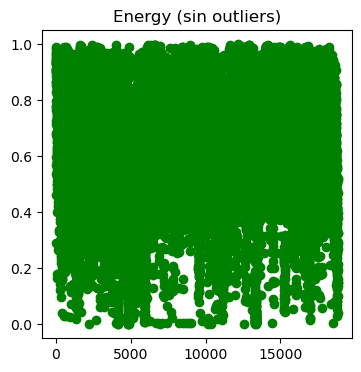

In [57]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(range(len(dfmusica)), dfmusica["Energy"], color='g')
ax.set_title("Energy (sin outliers)")
plt.show()

<h4 Style="color:#9C1A15"> Instrumentalness. Valores normales entre 0 y 1</h4>

In [58]:
minimo = 0
maximo = 1

In [59]:
atipicos_mayores = dfmusica["Instrumentalness"][dfmusica["Instrumentalness"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Instrumentalness"][dfmusica["Instrumentalness"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 1 : 0
Series([], Name: Instrumentalness, dtype: float64)

Valores menores a 0 : 0
Series([], Name: Instrumentalness, dtype: float64)


<h4 Style="color:#9C1A15"> Dado que no hay valores atípicos en esta variable, se decidió no intervenirla:</h4>

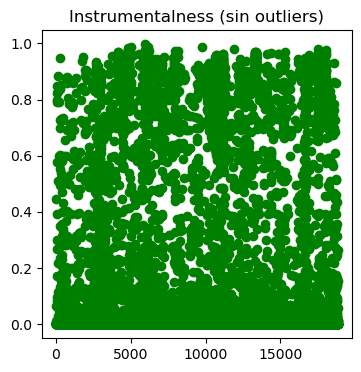

In [60]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(range(len(dfmusica)), dfmusica["Instrumentalness"], color='g')
ax.set_title("Instrumentalness (sin outliers)")
plt.show()

<h4 Style="color:#FF5500"> Key. Valores normales entre 0 a 11</h4>

In [61]:
minimo = 0
maximo = 11

<h4 Style="color:#FF5500"> Los valores atípicos para esta variable son:</h4>

In [62]:
atipicos_mayores = dfmusica["Key"][dfmusica["Key"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Key"][dfmusica["Key"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 11 : 0
Series([], Name: Key, dtype: int32)

Valores menores a 0 : 0
Series([], Name: Key, dtype: int32)


<h4 Style="color:#FF5500"> Dado que no hay valores atípicos en esta variable, se decidió no intervenirla:</h4>

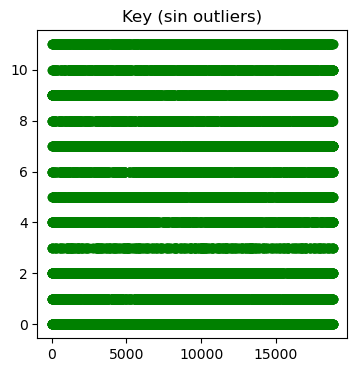

In [63]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(range(len(dfmusica)), dfmusica["Key"], color='g')
ax.set_title("Key (sin outliers)")
plt.show()

<h4 Style="color:#2C2966"> Liveness. Valores normales entre 0 a 1</h4>

In [64]:
minimo = 0
maximo = 1

<h4 Style="color:#2C2966"> Los valores atípicos para esta variable son:</h4>

In [65]:
atipicos_mayores = dfmusica["Liveness"][dfmusica["Liveness"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Liveness"][dfmusica["Liveness"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 1 : 0
Series([], Name: Liveness, dtype: float64)

Valores menores a 0 : 0
Series([], Name: Liveness, dtype: float64)


<h4 Style="color:#2C2966"> Dado que no hay valores atípicos en esta variable, se decidió no intervenirla:</h4>

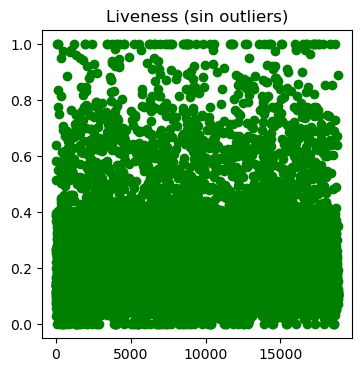

In [66]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(range(len(dfmusica)), dfmusica["Liveness"], color='g')
ax.set_title("Liveness (sin outliers)")
plt.show()

<h4 Style="color:#FF00FF"> Loudness. Valores normales entre -60 a 0</h4>

In [67]:
minimo = -60
maximo = 0

<h4 Style="color:#FF00FF"> Los valores atípicos para esta variable son:</h4>

In [68]:
atipicos_mayores = dfmusica["Loudness"][dfmusica["Loudness"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Loudness"][dfmusica["Loudness"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 0 : 389
39       0.163000
49       0.108000
61       0.061800
101      1.000000
117      0.000045
           ...   
18622    0.076600
18623    0.091500
18628    0.138000
18742    0.109000
18807    0.095300
Name: Loudness, Length: 389, dtype: float64

Valores menores a -60 : 0
Series([], Name: Loudness, dtype: float64)


<h4 Style="color:#FF00FF"> Identificación de outliers</h4>

<function matplotlib.pyplot.show(close=None, block=None)>

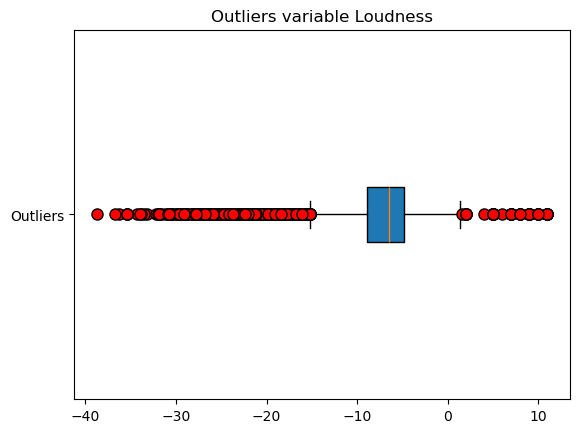

In [69]:
plt.boxplot(dfmusica["Loudness"], vert=False, patch_artist=True, labels=["Outliers"], flierprops=dict(marker='o', markerfacecolor='r', markersize=8))
plt.title("Outliers variable Loudness")
plt.show

<h4 Style="color:#FF00FF"> Eliminación de outliers</h4>

In [70]:
Loudness = dfmusica['Loudness']
Q1 = Loudness.quantile(.25)
Q3 = Loudness.quantile(.75)
IIQ = Q3 - Q1
limite_inferior = Q1 - 1.5 * IIQ
limite_superior = Q3 + 1.5 * IIQ

In [71]:
seleccion = dfmusica[(dfmusica["Loudness"] >= limite_inferior) & (dfmusica["Loudness"] <= limite_superior)]


<h4 Style="color:#FF00FF"> Nueva variable para el nuevo dataframe</h4>

In [72]:
dfmusica1 = dfmusica.loc[(dfmusica["Loudness"] >= limite_inferior) & (dfmusica["Loudness"] <= limite_superior)]

<h4 Style="color:#FF00FF"> Revisión de la variable con y sin outliers</h4>

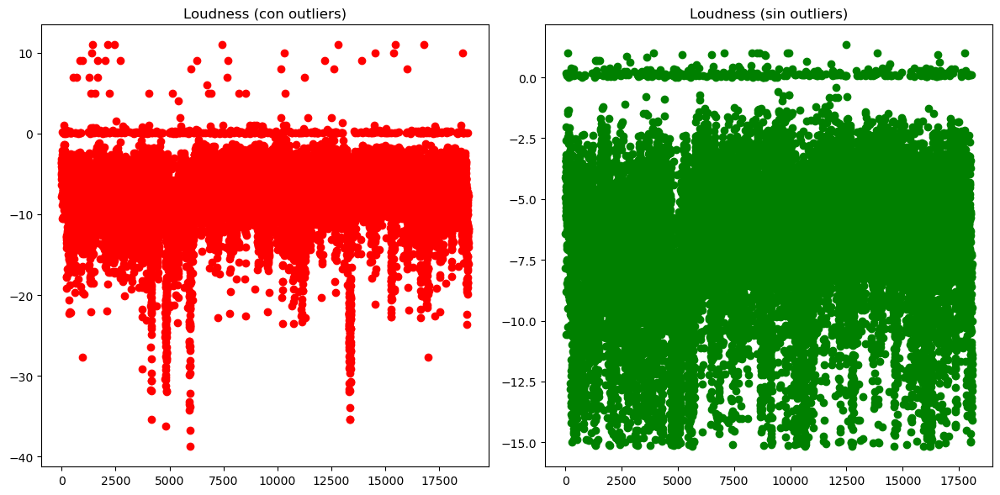

In [73]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].scatter(range(len(dfmusica)), dfmusica["Loudness"], color='r')
axs[0].set_title("Loudness (con outliers)")
axs[1].scatter(range(len(dfmusica1)), dfmusica1["Loudness"], color='g')
axs[1].set_title("Loudness (sin outliers)")
plt.tight_layout()
plt.show()

In [74]:
dfmusica1.describe()

,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence,Songpopularity(Norm),Songdurationseconds(Norm)
count,18091.000000,1.809100e+04,18091.000000,18091.000000,18091.000000,18091.000000,18091.000000,18091.000000,18091.000000,18091.000000,18091.000000,18091.000000,18091.000000,18091.000000,18091.000000,18091.000000
mean,53.050089,2.186893e+05,0.303045,0.665696,0.663145,0.073124,5.193687,0.184135,-6.816197,0.626858,27.118957,121.348254,3.942955,0.534311,0.530501,218.689254
std,21.842029,5.845929e+04,2.085546,1.375351,0.194777,0.208074,3.654702,0.152116,2.981525,0.478898,3627.879230,28.574065,0.326559,0.238268,0.218420,58.459291
min,0.000000,2.900000e+01,0.000001,0.000000,0.004130,0.000000,0.000000,0.000000,-15.178000,0.000000,0.000000,0.026900,0.000000,0.000000,0.000000,0.029000
25%,41.000000,1.859600e+05,0.023250,0.533000,0.532500,0.000000,2.000000,0.093300,-8.573000,0.000000,0.037700,99.874000,4.000000,0.347000,0.410000,185.960000
50%,55.000000,2.124290e+05,0.128000,0.646000,0.684000,0.000011,5.000000,0.124000,-6.378000,1.000000,0.056600,120.877098,4.000000,0.526243,0.550000,212.429000
75%,69.000000,2.419330e+05,0.410000,0.749000,0.819000,0.002480,8.000000,0.225000,-4.757500,1.000000,0.124000,139.912000,4.000000,0.723000,0.690000,241.933000
max,100.000000,1.799346e+06,88.000000,74.000000,0.999000,0.989000,11.000000,1.000000,1.342000,1.000000,487960.000000,242.318000,5.000000,0.984000,1.000000,1799.346000


<h4 Style="color:#64646C"> Audiomode. Valores normales entre 0 a 1</h4>

In [75]:
minimo = 0
maximo = 1

<h4 Style="color:#64646C"> Los valores atípicos para esta variable son:</h4>

In [76]:
atipicos_mayores = dfmusica["Audiomode"][dfmusica["Audiomode"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Audiomode"][dfmusica["Audiomode"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 1 : 0
Series([], Name: Audiomode, dtype: float64)

Valores menores a 0 : 0
Series([], Name: Audiomode, dtype: float64)


<h4 Style="color:#64646C"> Dado que no hay valores atípicos en esta variable, se decidió no intervenirla:</h4>

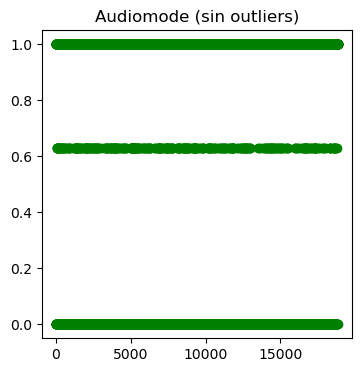

In [77]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(range(len(dfmusica)), dfmusica["Audiomode"], color='g')
ax.set_title("Audiomode (sin outliers)")
plt.show()

<h4 Style="color:#1CBCE8"> Speechness. Valores normales entre 0 a 1</h4>

In [78]:
minimo = 0
maximo = 1

<h4 Style="color:#1CBCE8"> Los valores atípicos para esta variable son:</h4>

In [79]:
atipicos_mayores = dfmusica["Speechness"][dfmusica["Speechness"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Speechness"][dfmusica["Speechness"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 1 : 73
101      26.115696
538      26.115696
682      26.115696
845      26.115696
981      26.115696
           ...    
15442    26.115696
16013    26.115696
16790    26.115696
18489    26.115696
18577    26.115696
Name: Speechness, Length: 73, dtype: float64

Valores menores a 0 : 0
Series([], Name: Speechness, dtype: float64)


<h4 Style="color:#1CBCE8"> Identificación de outliers</h4>

<function matplotlib.pyplot.show(close=None, block=None)>

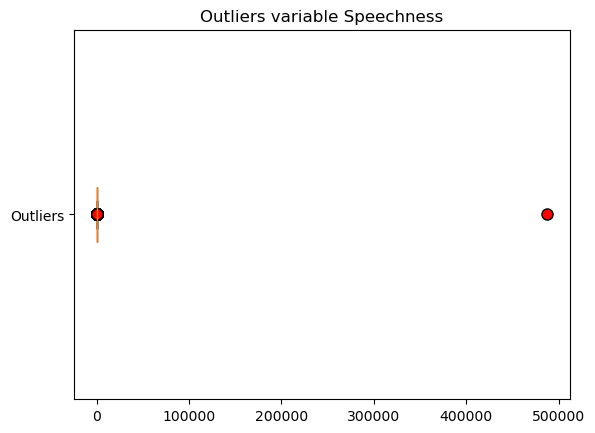

In [80]:
plt.boxplot(dfmusica["Speechness"], vert=False, patch_artist=True, labels=["Outliers"], flierprops=dict(marker='o', markerfacecolor='r', markersize=8))
plt.title("Outliers variable Speechness")
plt.show

<h4 Style="color:#1CBCE8"> Eliminación de outliers</h4>

In [81]:
Speechness = dfmusica['Speechness']
Q1 = Speechness.quantile(.25)
Q3 = Speechness.quantile(.75)
IIQ = Q3 - Q1
limite_inferior = Q1 - 1.5 * IIQ
limite_superior = Q3 + 1.5 * IIQ

In [82]:
seleccion = dfmusica[(dfmusica["Speechness"] >= limite_inferior) & (dfmusica["Speechness"] <= limite_superior)]


<h4 Style="color:#1CBCE8"> Nueva variable para el nuevo dataframe</h4>

In [83]:
dfmusica1 = dfmusica.loc[(dfmusica["Speechness"] >= limite_inferior) & (dfmusica["Speechness"] <= limite_superior)]

<h4 Style="color:#1CBCE8"> Revisión de la variable con y sin outliers</h4>

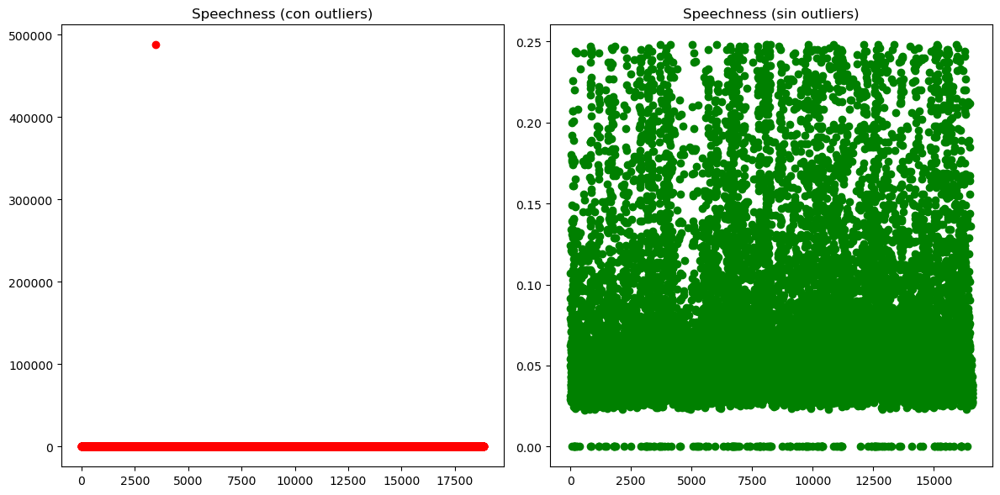

In [84]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].scatter(range(len(dfmusica)), dfmusica["Speechness"], color='r')
axs[0].set_title("Speechness (con outliers)")
axs[1].scatter(range(len(dfmusica1)), dfmusica1["Speechness"], color='g')
axs[1].set_title("Speechness (sin outliers)")
plt.tight_layout()
plt.show()

In [85]:
dfmusica1.describe()

,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence,Songpopularity(Norm),Songdurationseconds(Norm)
count,16595.000000,1.659500e+04,16595.000000,16595.000000,16595.000000,16595.000000,16595.000000,16595.000000,16595.000000,16595.000000,16595.000000,16595.000000,16595.000000,16595.000000,16595.000000,16595.000000
mean,52.812097,2.195223e+05,0.264162,0.651838,0.645161,0.088678,5.204098,0.178871,-7.416671,0.642683,0.070909,120.610966,3.944742,0.525303,0.528121,219.522305
std,21.626104,5.977867e+04,0.293602,1.317899,0.217452,0.234730,3.615613,0.146351,3.960339,0.476975,0.051624,27.696532,0.315553,0.247095,0.216261,59.778674
min,0.000000,4.100000e+01,0.000001,0.000000,0.001070,0.000000,0.000000,0.000000,-38.768000,0.000000,0.000000,0.047600,0.000000,0.000000,0.000000,0.041000
25%,41.000000,1.860800e+05,0.022100,0.523000,0.506000,0.000000,2.000000,0.092600,-9.088500,0.000000,0.036300,99.895000,4.000000,0.329000,0.410000,186.080000
50%,55.000000,2.125710e+05,0.135000,0.636000,0.676000,0.000023,5.000000,0.121000,-6.514000,1.000000,0.050000,120.023000,4.000000,0.524000,0.550000,212.571000
75%,68.000000,2.431600e+05,0.452000,0.739000,0.817500,0.004880,8.000000,0.217000,-4.862500,1.000000,0.085500,137.763000,4.000000,0.726000,0.680000,243.160000
max,100.000000,1.799346e+06,0.996000,74.000000,0.999000,0.997000,11.000000,1.000000,1.585000,1.000000,0.248000,213.990000,5.000000,0.984000,1.000000,1799.346000


<h4 Style="color:#9C1A15"> Tempo. Valores normales entre 50 a Infinito</h4>

In [86]:
minimo = 50
maximo = 1000000000000000000000000000000000000

<h4 Style="color:#9C1A15"> Los valores atípicos para esta variable son:</h4>

In [87]:
atipicos_mayores = dfmusica["Tempo"][dfmusica["Tempo"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Tempo"][dfmusica["Tempo"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 1000000000000000000000000000000000000 : 0
Series([], Name: Tempo, dtype: float64)

Valores menores a 50 : 37
14393     0.2360
14634     0.0725
14703     0.0433
14811     0.1390
14830     0.0363
14937     0.1540
14985     0.0784
15039     0.0511
15047     0.0522
15127     0.1470
15272     0.0414
15293    47.9530
15430     0.0952
16172     0.4840
16563     0.0712
16629     0.0894
16630     0.0402
16719     0.1310
16720     0.0847
16738     0.0432
16745     0.0316
16899     0.0269
16928     0.0309
17169     0.4080
17336     0.0481
17370     0.3620
17380     0.0495
17887     0.0718
17939     0.0474
18019     0.0597
18518     0.0655
18569     0.0290
18622     0.0476
18628     0.0402
18742     0.0316
18807     0.0474
18818    46.5910
Name: Tempo, dtype: float64


<h4 Style="color:#9C1A15"> Identificación de outliers</h4>

<function matplotlib.pyplot.show(close=None, block=None)>

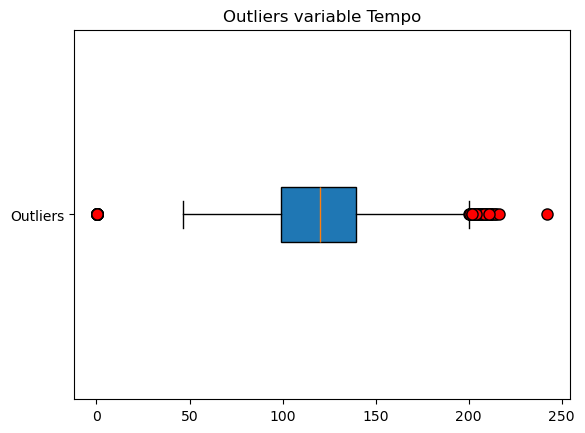

In [88]:
plt.boxplot(dfmusica["Tempo"], vert=False, patch_artist=True, labels=["Outliers"], flierprops=dict(marker='o', markerfacecolor='r', markersize=8))
plt.title("Outliers variable Tempo")
plt.show

<h4 Style="color:#9C1A15"> Eliminación de outliers</h4>

In [89]:
Tempo = dfmusica['Tempo']
Q1 = Tempo.quantile(.25)
Q3 = Tempo.quantile(.75)
IIQ = Q3 - Q1
limite_inferior = Q1 - 1.5 * IIQ
limite_superior = Q3 + 1.5 * IIQ

In [90]:
seleccion = dfmusica[(dfmusica["Tempo"] >= limite_inferior) & (dfmusica["Tempo"] <= limite_superior)]


<h4 Style="color:#9C1A15"> Nueva variable para el nuevo dataframe</h4>

In [91]:
dfmusica1 = dfmusica.loc[(dfmusica["Tempo"] >= limite_inferior) & (dfmusica["Tempo"] <= limite_superior)]

<h4 Style="color:#9C1A15"> Revisión de la variable con y sin outliers</h4>

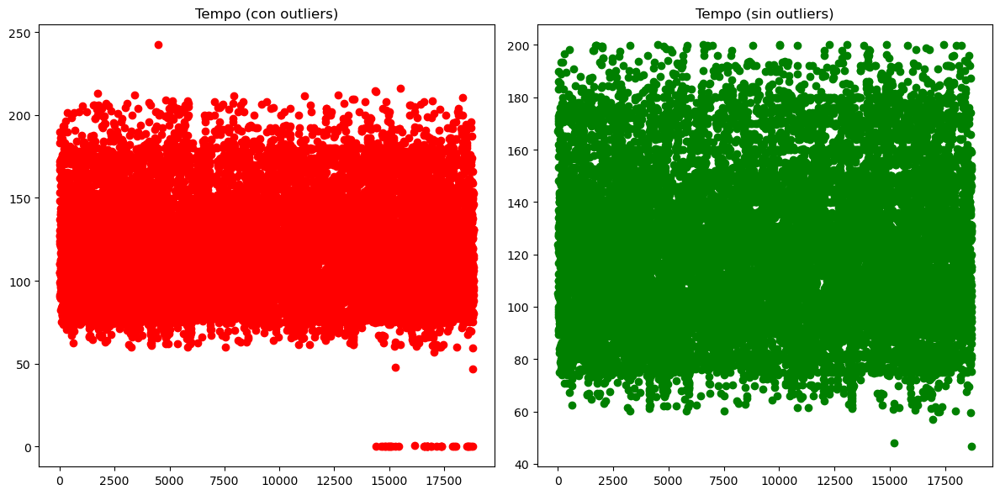

In [92]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].scatter(range(len(dfmusica)), dfmusica["Tempo"], color='r')
axs[0].set_title("Tempo (con outliers)")
axs[1].scatter(range(len(dfmusica1)), dfmusica1["Tempo"], color='g')
axs[1].set_title("Tempo (sin outliers)")
plt.tight_layout()
plt.show()

In [93]:
dfmusica1.describe()

,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence,Songpopularity(Norm),Songdurationseconds(Norm)
count,18704.000000,1.870400e+04,18704.000000,18704.000000,18704.000000,18704.000000,18704.000000,18704.000000,18704.000000,18704.000000,18704.000000,18704.000000,18704.000000,18704.000000,18704.000000,18704.000000
mean,52.937129,2.182902e+05,0.460326,0.661067,0.644675,0.088842,5.185468,0.181885,-7.273089,0.629386,26.296298,120.667912,3.938623,0.525772,0.529371,218.290155
std,21.690095,5.946088e+04,3.574972,1.353261,0.214451,0.233957,3.650358,0.150886,3.975365,0.478221,3567.934190,27.751420,0.336957,0.242102,0.216901,59.460884
min,0.000000,2.900000e+01,0.000001,0.000000,0.000247,0.000000,0.000000,0.000000,-38.768000,0.000000,0.000000,46.591000,0.000000,0.000000,0.000000,0.029000
25%,41.000000,1.850260e+05,0.025200,0.530000,0.511000,0.000000,2.000000,0.093100,-8.959750,0.000000,0.037600,98.993500,4.000000,0.337000,0.410000,185.026000
50%,55.000000,2.121700e+05,0.138000,0.643000,0.674000,0.000014,5.000000,0.123000,-6.496500,1.000000,0.055600,120.095000,4.000000,0.526243,0.550000,212.170000
75%,68.250000,2.420000e+05,0.452000,0.747000,0.814000,0.003960,8.000000,0.220000,-4.822000,1.000000,0.121000,138.723750,4.000000,0.718000,0.682500,242.000000
max,100.000000,1.799346e+06,88.000000,74.000000,0.999000,0.997000,11.000000,1.000000,11.000000,1.000000,487960.000000,200.066000,5.000000,0.984000,1.000000,1799.346000


<h4 Style="color:#271080"> Timesignature. Valores normales entre 2 a 6</h4>

In [94]:
minimo = 2
maximo = 6

<h4 Style="color:#271080"> Los valores atípicos para esta variable son:</h4>

In [95]:
atipicos_mayores = dfmusica["Timesignature"][dfmusica["Timesignature"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Timesignature"][dfmusica["Timesignature"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 6 : 0
Series([], Name: Timesignature, dtype: int32)

Valores menores a 2 : 89
53       1
117      1
246      1
405      1
771      0
        ..
18409    1
18540    1
18553    1
18741    1
18787    1
Name: Timesignature, Length: 89, dtype: int32


<h4 Style="color:#271080"> Identificación de outliers</h4>

<function matplotlib.pyplot.show(close=None, block=None)>

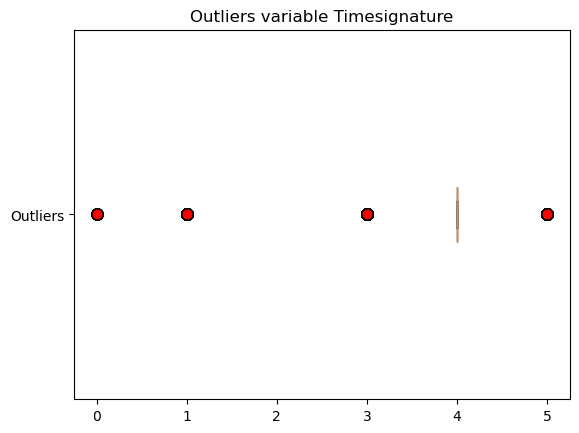

In [96]:
plt.boxplot(dfmusica["Timesignature"], vert=False, patch_artist=True, labels=["Outliers"], flierprops=dict(marker='o', markerfacecolor='r', markersize=8))
plt.title("Outliers variable Timesignature")
plt.show

<h4 Style="color:#271080"> Eliminación de outliers</h4>

In [97]:
Timesignature = dfmusica['Timesignature']
Q1 = Timesignature.quantile(.25)
Q3 = Timesignature.quantile(.75)
IIQ = Q3 - Q1
limite_inferior = Q1 - 1.5 * IIQ
limite_superior = Q3 + 1.5 * IIQ

In [98]:
seleccion = dfmusica[(dfmusica["Timesignature"] >= limite_inferior) & (dfmusica["Timesignature"] <= limite_superior)]


<h4 Style="color:#271080"> Nueva variable para el nuevo dataframe</h4>

In [99]:
dfmusica1 = dfmusica.loc[(dfmusica["Timesignature"] >= limite_inferior) & (dfmusica["Timesignature"] <= limite_superior)]

<h4 Style="color:#271080"> Revisión de la variable con y sin outliers</h4>

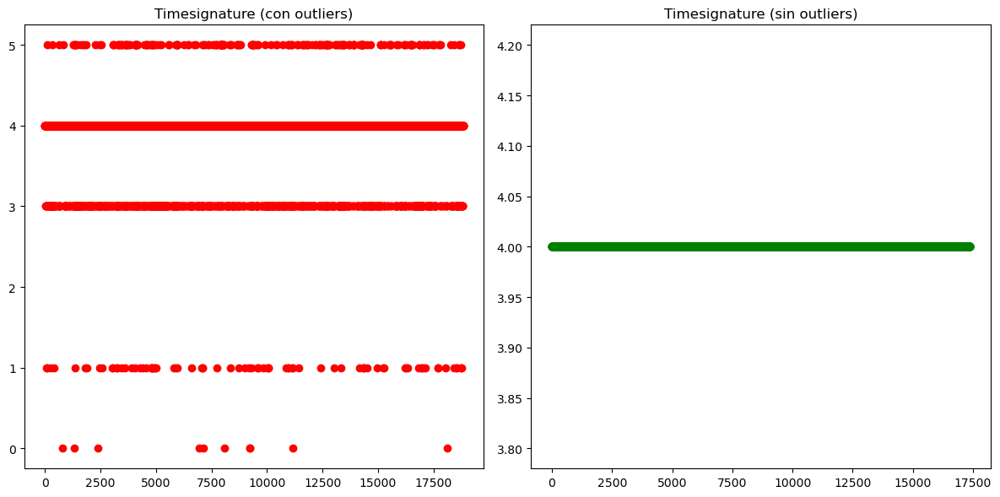

In [100]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].scatter(range(len(dfmusica)), dfmusica["Timesignature"], color='r')
axs[0].set_title("Timesignature (con outliers)")
axs[1].scatter(range(len(dfmusica1)), dfmusica1["Timesignature"], color='g')
axs[1].set_title("Timesignature (sin outliers)")
plt.tight_layout()
plt.show()

In [101]:
dfmusica1.describe()

,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence,Songpopularity(Norm),Songdurationseconds(Norm)
count,17369.000000,1.736900e+04,17369.000000,17369.000000,17369.000000,17369.000000,17369.000000,17369.000000,17369.000000,17369.000000,17369.000000,17369.000000,17369.0,17369.000000,17369.000000,17369.000000
mean,53.103575,2.181911e+05,0.244167,0.640558,0.655771,0.073377,5.284242,0.180257,-7.291431,0.627209,0.101466,121.046035,4.0,0.534752,0.531036,218.191126
std,21.922827,5.976634e+04,0.277540,0.152726,0.206929,0.213862,3.618222,0.143872,3.632868,0.483561,0.102558,28.274753,0.0,0.241979,0.219228,59.766340
min,0.000000,2.618600e+04,0.000001,0.059400,0.001070,0.000000,0.000000,0.010900,-36.729000,0.000000,0.022400,46.591000,4.0,0.023000,0.000000,26.186000
25%,41.000000,1.845600e+05,0.022300,0.543000,0.524000,0.000000,2.000000,0.093000,-8.845000,0.000000,0.038000,98.882000,4.0,0.343000,0.410000,184.560000
50%,56.000000,2.113060e+05,0.123000,0.651000,0.682000,0.000011,5.000000,0.122000,-6.477000,1.000000,0.056200,120.026000,4.0,0.535000,0.560000,211.306000
75%,69.000000,2.424070e+05,0.395000,0.752000,0.820000,0.002280,8.000000,0.224000,-4.882000,1.000000,0.119000,139.912000,4.0,0.731000,0.690000,242.407000
max,100.000000,1.799346e+06,0.996000,0.987000,0.999000,0.997000,11.000000,0.984000,1.585000,1.000000,0.941000,216.115000,4.0,0.984000,1.000000,1799.346000


<h4 Style="color:#359441"> Audiovalence. Valores normales entre 0 o 1</h4>

In [102]:
minimo = 0
maximo = 1

<h4 Style="color:#359441"> Los valores atípicos para esta variable son:</h4>

In [103]:
atipicos_mayores = dfmusica["Audiovalence"][dfmusica["Audiovalence"] > maximo]
cantidad_mayores = len(atipicos_mayores)

atipicos_menores = dfmusica["Audiovalence"][dfmusica["Audiovalence"] < minimo]
cantidad_menores = len(atipicos_menores)

print("Valores mayores a", maximo, ":", cantidad_mayores)
print(atipicos_mayores)

print("\nValores menores a", minimo, ":", cantidad_menores)
print(atipicos_menores)

Valores mayores a 1 : 0
Series([], Name: Audiovalence, dtype: float64)

Valores menores a 0 : 0
Series([], Name: Audiovalence, dtype: float64)


<h4 Style="color:#359441"> Dado que no hay valores atípicos en esta variable, se decidió no intervenirla:</h4>

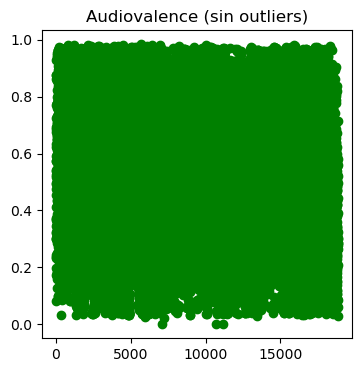

In [104]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(range(len(dfmusica)), dfmusica["Audiovalence"], color='g')
ax.set_title("Audiovalence (sin outliers)")
plt.show()

In [105]:
dfmusica1.describe()

,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence,Songpopularity(Norm),Songdurationseconds(Norm)
count,17369.000000,1.736900e+04,17369.000000,17369.000000,17369.000000,17369.000000,17369.000000,17369.000000,17369.000000,17369.000000,17369.000000,17369.000000,17369.0,17369.000000,17369.000000,17369.000000
mean,53.103575,2.181911e+05,0.244167,0.640558,0.655771,0.073377,5.284242,0.180257,-7.291431,0.627209,0.101466,121.046035,4.0,0.534752,0.531036,218.191126
std,21.922827,5.976634e+04,0.277540,0.152726,0.206929,0.213862,3.618222,0.143872,3.632868,0.483561,0.102558,28.274753,0.0,0.241979,0.219228,59.766340
min,0.000000,2.618600e+04,0.000001,0.059400,0.001070,0.000000,0.000000,0.010900,-36.729000,0.000000,0.022400,46.591000,4.0,0.023000,0.000000,26.186000
25%,41.000000,1.845600e+05,0.022300,0.543000,0.524000,0.000000,2.000000,0.093000,-8.845000,0.000000,0.038000,98.882000,4.0,0.343000,0.410000,184.560000
50%,56.000000,2.113060e+05,0.123000,0.651000,0.682000,0.000011,5.000000,0.122000,-6.477000,1.000000,0.056200,120.026000,4.0,0.535000,0.560000,211.306000
75%,69.000000,2.424070e+05,0.395000,0.752000,0.820000,0.002280,8.000000,0.224000,-4.882000,1.000000,0.119000,139.912000,4.0,0.731000,0.690000,242.407000
max,100.000000,1.799346e+06,0.996000,0.987000,0.999000,0.997000,11.000000,0.984000,1.585000,1.000000,0.941000,216.115000,4.0,0.984000,1.000000,1799.346000


<h4 Style="color:#008080"> 3.15  Se hizo un comparartivo del dataframe original versus el dataframe sin outliers para verificar la cantidad de data que se perdió. </h4>

In [106]:
dfmusica.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18835 entries, 0 to 18834
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Songname                   18835 non-null  object 
 1   Songpopularity             18835 non-null  float64
 2   Songdurationmilliseconds   18835 non-null  float64
 3   Acousticness               18835 non-null  float64
 4   Danceability               18835 non-null  float64
 5   Energy                     18835 non-null  float64
 6   Instrumentalness           18835 non-null  float64
 7   Key                        18835 non-null  int32  
 8   Liveness                   18835 non-null  float64
 9   Loudness                   18835 non-null  float64
 10  Audiomode                  18835 non-null  float64
 11  Speechness                 18835 non-null  float64
 12  Tempo                      18835 non-null  float64
 13  Timesignature              18835 non-null  int

In [107]:
dfmusica1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17369 entries, 0 to 18834
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Songname                   17369 non-null  object 
 1   Songpopularity             17369 non-null  float64
 2   Songdurationmilliseconds   17369 non-null  float64
 3   Acousticness               17369 non-null  float64
 4   Danceability               17369 non-null  float64
 5   Energy                     17369 non-null  float64
 6   Instrumentalness           17369 non-null  float64
 7   Key                        17369 non-null  int32  
 8   Liveness                   17369 non-null  float64
 9   Loudness                   17369 non-null  float64
 10  Audiomode                  17369 non-null  float64
 11  Speechness                 17369 non-null  float64
 12  Tempo                      17369 non-null  float64
 13  Timesignature              17369 non-null  int32  


<h4 Style="color:#008080"> 3.16  Se calculó la cantidad de datos perdidos durante la depuración y eliminación de outliers y se estimó que no se causa gran impacto a los resultados del ejercicio. </h4>

In [108]:
num_filas_df1 = len(dfmusica)
num_filas_df2 = len(dfmusica1)
diferencia_absoluta = ((num_filas_df1 - num_filas_df2))
diferencia_porcentual = ((num_filas_df1 - num_filas_df2) / num_filas_df1) * 100
diferencia_porcentual_redondeada = round(diferencia_porcentual, 2)
print("Número de filas en dataframe original:", num_filas_df1)
print("Número de filas en dataframe sin outliers:", num_filas_df2)
print("Número de filas perdidas con la depuración:", diferencia_absoluta)
print("Porcentaje de datos perdidos con la depuración :", diferencia_porcentual_redondeada, "%")

Número de filas en dataframe original: 18835
Número de filas en dataframe sin outliers: 17369
Número de filas perdidas con la depuración: 1466
Porcentaje de datos perdidos con la depuración : 7.78 %


<h4 Style="color:#009000"> 4. Selección de características. </h4>

<h4 Style="color:#008080"> 4.1 Se utilizó el análisis de componentes principales (PCA). </h4>

<h4 Style="color:#000000"> 4.1.1 Primero se indicó a Python que solo se va a trabajar con variables numéricas porque el dataframe contiene una columna de nombre de las canciones. </h4>

In [109]:
dfmusica1 = dfmusica1.select_dtypes(include='number')

<h4 Style="color:#008080"> 4.2 Se utilizó el análisis de componentes principales (PCA). </h4>

In [110]:
dfmusica1.corr()

,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Timesignature,Audiovalence,Songpopularity(Norm),Songdurationseconds(Norm)
Songpopularity,1.000000,-0.017968,-0.064098,0.101892,-0.005015,-0.131398,-0.004207,-0.039775,0.100126,0.001182,0.021045,-0.019818,NaN,-0.059867,1.000000,-0.017968
Songdurationmilliseconds,-0.017968,1.000000,-0.098028,-0.105942,0.097118,-0.007447,-0.006927,0.014493,0.007429,-0.023755,-0.087670,0.007104,NaN,-0.055119,-0.017968,1.000000
Acousticness,-0.064098,-0.098028,1.000000,-0.138496,-0.639154,0.153733,-0.000447,-0.089595,-0.538704,0.060692,-0.073784,-0.143471,NaN,-0.086669,-0.064098,-0.098028
Danceability,0.101892,-0.105942,-0.138496,1.000000,-0.017065,-0.108189,0.014139,-0.096656,0.133580,-0.102813,0.218781,-0.128285,NaN,0.302073,0.101892,-0.105942
Energy,-0.005015,0.097118,-0.639154,-0.017065,1.000000,-0.184018,0.020493,0.170435,0.745347,-0.047971,0.040411,0.172291,NaN,0.287585,-0.005015,0.097118
Instrumentalness,-0.131398,-0.007447,0.153733,-0.108189,-0.184018,1.000000,-0.010798,-0.029068,-0.358680,-0.015473,-0.079486,-0.028189,NaN,-0.157266,-0.131398,-0.007447
Key,-0.004207,-0.006927,-0.000447,0.014139,0.020493,-0.010798,1.000000,-0.008947,0.012543,-0.174365,0.041784,0.007272,NaN,0.030768,-0.004207,-0.006927
Liveness,-0.039775,0.014493,-0.089595,-0.096656,0.170435,-0.029068,-0.008947,1.000000,0.103901,-0.004390,0.092021,0.031049,NaN,0.014394,-0.039775,0.014493
Loudness,0.100126,0.007429,-0.538704,0.133580,0.745347,-0.358680,0.012543,0.103901,1.000000,-0.058363,0.063105,0.130732,NaN,0.163909,0.100126,0.007429
Audiomode,0.001182,-0.023755,0.060692,-0.102813,-0.047971,-0.015473,-0.174365,-0.004390,-0.058363,1.000000,-0.107265,0.021666,NaN,0.001249,0.001182,-0.023755


<h4 Style="color:#008080"> 4.3 Se eliminó la variable Timesignature porque tenía valores NaN. (Esto sucedió porque solo tenía un valor en toda la columna. El número 4.) </h4>

In [111]:
dfmusica1.drop(columns=['Timesignature'], inplace=True)

In [112]:
dfmusica1.corr()

,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Loudness,Audiomode,Speechness,Tempo,Audiovalence,Songpopularity(Norm),Songdurationseconds(Norm)
Songpopularity,1.000000,-0.017968,-0.064098,0.101892,-0.005015,-0.131398,-0.004207,-0.039775,0.100126,0.001182,0.021045,-0.019818,-0.059867,1.000000,-0.017968
Songdurationmilliseconds,-0.017968,1.000000,-0.098028,-0.105942,0.097118,-0.007447,-0.006927,0.014493,0.007429,-0.023755,-0.087670,0.007104,-0.055119,-0.017968,1.000000
Acousticness,-0.064098,-0.098028,1.000000,-0.138496,-0.639154,0.153733,-0.000447,-0.089595,-0.538704,0.060692,-0.073784,-0.143471,-0.086669,-0.064098,-0.098028
Danceability,0.101892,-0.105942,-0.138496,1.000000,-0.017065,-0.108189,0.014139,-0.096656,0.133580,-0.102813,0.218781,-0.128285,0.302073,0.101892,-0.105942
Energy,-0.005015,0.097118,-0.639154,-0.017065,1.000000,-0.184018,0.020493,0.170435,0.745347,-0.047971,0.040411,0.172291,0.287585,-0.005015,0.097118
Instrumentalness,-0.131398,-0.007447,0.153733,-0.108189,-0.184018,1.000000,-0.010798,-0.029068,-0.358680,-0.015473,-0.079486,-0.028189,-0.157266,-0.131398,-0.007447
Key,-0.004207,-0.006927,-0.000447,0.014139,0.020493,-0.010798,1.000000,-0.008947,0.012543,-0.174365,0.041784,0.007272,0.030768,-0.004207,-0.006927
Liveness,-0.039775,0.014493,-0.089595,-0.096656,0.170435,-0.029068,-0.008947,1.000000,0.103901,-0.004390,0.092021,0.031049,0.014394,-0.039775,0.014493
Loudness,0.100126,0.007429,-0.538704,0.133580,0.745347,-0.358680,0.012543,0.103901,1.000000,-0.058363,0.063105,0.130732,0.163909,0.100126,0.007429
Audiomode,0.001182,-0.023755,0.060692,-0.102813,-0.047971,-0.015473,-0.174365,-0.004390,-0.058363,1.000000,-0.107265,0.021666,0.001249,0.001182,-0.023755


<h4 Style="color:#008080"> 4.4 Se graficó el mapa de calor de la matriz de correlación. </h4>

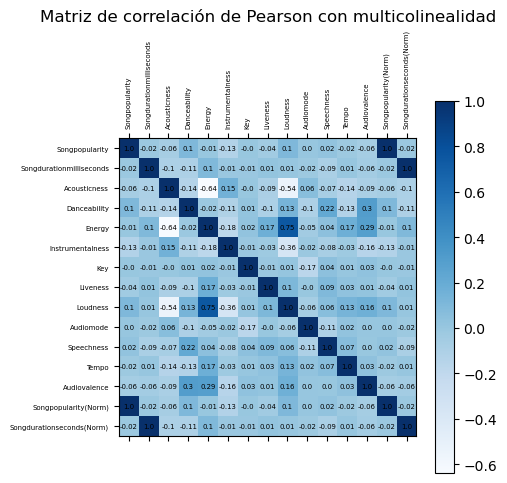

In [113]:
matriz = dfmusica1.corr()
plt.matshow(matriz, cmap = "Blues")
plt.xticks(range(15), dfmusica1.columns, rotation = 90, fontsize = 5)
plt.yticks(range(15), dfmusica1.columns, fontsize = 5)

for i in range(len(matriz.columns)):
    for j in range(len(matriz.columns)):
        plt.text(i, j, round(matriz.iloc[i, j],2), ha = "center", va = "center", fontsize=5)

plt.colorbar()
plt.title('Matriz de correlación de Pearson con multicolinealidad')

plt.show()

<h4 Style="color:#008080"> 4.5 Se filtró las variables que tenían una correlación de 70% o más. </h4>

In [114]:
dfmusica2 = dfmusica1[["Songpopularity", "Songdurationmilliseconds", "Acousticness", "Danceability",	"Energy",	"Instrumentalness",	"Key",	"Liveness",		"Audiomode",	"Speechness",	"Tempo",	"Audiovalence"]]

<h4 Style="color:#008080"> 4.6 Se revisó la nueva matriz de correlación. </h4>

In [115]:
dfmusica2.corr()

,Songpopularity,Songdurationmilliseconds,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Audiomode,Speechness,Tempo,Audiovalence
Songpopularity,1.000000,-0.017968,-0.064098,0.101892,-0.005015,-0.131398,-0.004207,-0.039775,0.001182,0.021045,-0.019818,-0.059867
Songdurationmilliseconds,-0.017968,1.000000,-0.098028,-0.105942,0.097118,-0.007447,-0.006927,0.014493,-0.023755,-0.087670,0.007104,-0.055119
Acousticness,-0.064098,-0.098028,1.000000,-0.138496,-0.639154,0.153733,-0.000447,-0.089595,0.060692,-0.073784,-0.143471,-0.086669
Danceability,0.101892,-0.105942,-0.138496,1.000000,-0.017065,-0.108189,0.014139,-0.096656,-0.102813,0.218781,-0.128285,0.302073
Energy,-0.005015,0.097118,-0.639154,-0.017065,1.000000,-0.184018,0.020493,0.170435,-0.047971,0.040411,0.172291,0.287585
Instrumentalness,-0.131398,-0.007447,0.153733,-0.108189,-0.184018,1.000000,-0.010798,-0.029068,-0.015473,-0.079486,-0.028189,-0.157266
Key,-0.004207,-0.006927,-0.000447,0.014139,0.020493,-0.010798,1.000000,-0.008947,-0.174365,0.041784,0.007272,0.030768
Liveness,-0.039775,0.014493,-0.089595,-0.096656,0.170435,-0.029068,-0.008947,1.000000,-0.004390,0.092021,0.031049,0.014394
Audiomode,0.001182,-0.023755,0.060692,-0.102813,-0.047971,-0.015473,-0.174365,-0.004390,1.000000,-0.107265,0.021666,0.001249
Speechness,0.021045,-0.087670,-0.073784,0.218781,0.040411,-0.079486,0.041784,0.092021,-0.107265,1.000000,0.070154,0.000206


<h4 Style="color:#008080"> 4.8 Se volvió a generar el mapa de calor de la matriz de correlacion sin las variables altamente relacionadas. </h4>

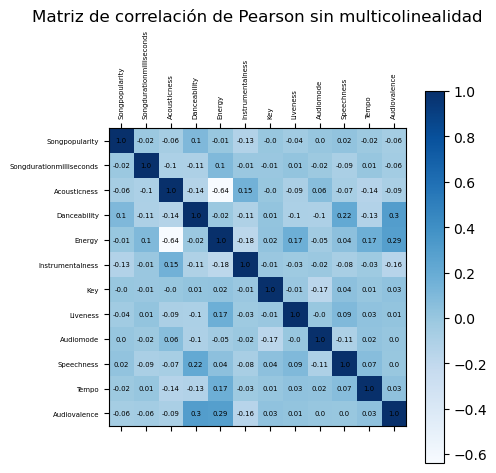

In [116]:
matriz = dfmusica2.corr()
plt.matshow(matriz, cmap = "Blues")
plt.xticks(range(12), dfmusica2.columns, rotation = 90, fontsize = 5)
plt.yticks(range(12), dfmusica2.columns, fontsize = 5)

for i in range(len(matriz.columns)):
    for j in range(len(matriz.columns)):
        plt.text(i, j, round(matriz.iloc[i, j],2), ha = "center", va = "center", fontsize=5)

plt.colorbar()
plt.title('Matriz de correlación de Pearson sin multicolinealidad')

plt.show()

<h4 Style="color:#008080"> 5. Modelado. </h4>

<h4 Style="color:#008080"> 5.1 Regresión lineal simple. </h4>

<h4 Style="color:#008080"> 5.1.1 Selección de variables. </h4>

<p style="text-align:justify">
Se analizó cuáles variables podrían ser útiles para predecir la popularidad de una canción, llegando a los siguientes hallazgos:
</p>
<ul>
    <li><strong>Danceability:</strong> Esta variable podría ser útil, ya que las canciones con un ritmo más bailable suelen tener una mayor aceptación entre el público general.<
    /li>
    <li><strong>Energy:</strong> La energía de una canción puede influir en su popularidad, ya que las canciones con una energía más alta a menudo son más pegajosas y atractivas para los oyentes.
    </li>
    <li><strong>Acousticness:</strong> La presencia de elementos acústicos en una canción podría ser un factor importante, ya que algunas audiencias prefieren música más orgánica y menos procesada
    .</li>
    <li><strong>Speechness:</strong> Esta variable indica la cantidad de palabras habladas en una canción en comparación con la música. Dependiendo del género musical y la audiencia objetivo, la presencia o ausencia de voces y letras claras podría ser relevante para la popularida
    d.</li>
    <li><strong>Tempo:</strong> El ritmo y la velocidad de una canción (tempo) pueden afectar significativamente su atractivo y potencial de popularidad, especialmente en géneros como la música dance o la música urba
    a.</li>
</ul>bana.

 

<p style="text-align:justify">
Posteriormente se graficó cada una de estas variables para ver su distribución y por medio visual iniciar a seleccionar me sirven como independientes para el modelo
</p>
<ul>

In [117]:
dfmusica3 = dfmusica2[['Danceability','Energy','Acousticness','Speechness','Tempo','Songpopularity']]
dfmusica3.head(9)

,Danceability,Energy,Acousticness,Speechness,Tempo,Songpopularity
0,0.496,0.682,0.005520,0.0294,167.060,73.0
1,0.542,0.853,0.010300,0.0498,105.256,66.0
2,0.737,0.463,0.008170,0.0792,123.881,76.0
3,0.451,0.970,0.026400,0.1070,122.444,74.0
4,0.447,0.766,0.000954,0.0313,172.011,56.0
5,0.316,0.945,0.008950,0.1240,189.931,80.0
6,0.581,0.887,0.000504,0.0624,90.578,81.0
7,0.613,0.953,0.001480,0.0855,105.046,76.0
8,0.330,0.936,0.001080,0.0917,148.112,80.0


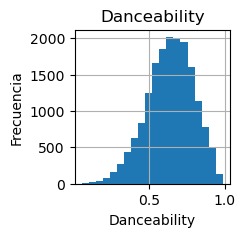

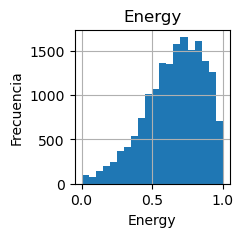

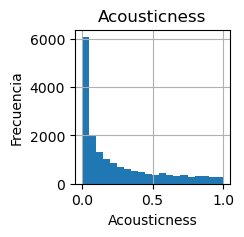

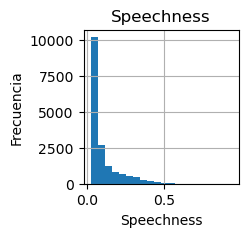

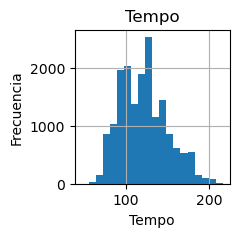

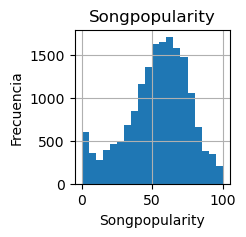

In [118]:
for col in dfmusica3.columns:
    plt.figure(figsize=(2, 2)) 
    plt.hist(dfmusica3[col], bins=20)
    plt.title(col)  
    plt.xlabel(col)  
    plt.ylabel('Frecuencia')  # Etiqueta del eje y
    plt.grid(True)  # Mostrar cuadrícula
    plt.show()

<p Style="text-align: justify"> Seguidamente, y a pesar de que con el análisis anterior se debería descartar las variables Acousticness y Spechness porque evidentemente no presentan dispersión, se graficó variable por variable, incluyendo estas dos para analizar más a profundidad la dispersión de ellas y la variable dependiente, con el objetivo de seleccionar, ahora si, cuales podrían ser mis elementos o variables predictoras.</p>

<h4 Style="color:#008080"> Danceability. </h4>

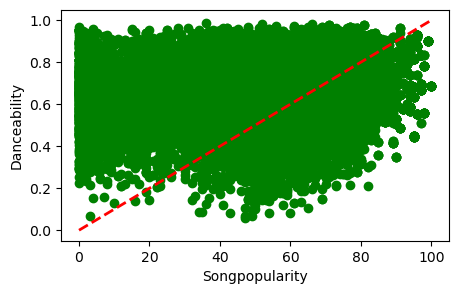

In [119]:
plt.figure(figsize=(5, 3))

plt.scatter(dfmusica3.Songpopularity	, dfmusica3.Danceability,  color='green')
plt.xlabel("Songpopularity")
plt.ylabel("Danceability")

plt.plot([0, 100], [0, 1], color='red', linestyle='--', linewidth=2, label='Example Line')
plt.show()

<p Style="text-align: justify"> Como se puede observar, el gráfico no es claro para mostrar el comportamiento de la variable porque tiene demasiados datos. Dado lo anterior se tomó la decisión de reducir la muestra a mil observaciones, a efectos de analizar visualmente cuales variables poseen el comportamiento buscado.</p>

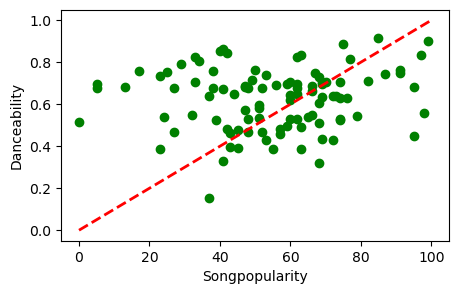

In [120]:
sample_size = 100
sample_data = dfmusica3.sample(n=sample_size, random_state=42) 
plt.figure(figsize=(5, 3))

plt.scatter(sample_data['Songpopularity'], sample_data['Danceability'], color='green')
plt.xlabel("Songpopularity")
plt.ylabel("Danceability")

plt.plot([0, 100], [0, 1], color='red', linestyle='--', linewidth=2, label='Example Line')
plt.show()

<h4 Style="color:#008080"> Energy. </h4>

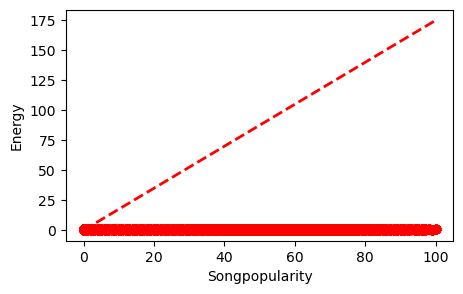

In [121]:
plt.figure(figsize=(5, 3))

plt.scatter(dfmusica3.Songpopularity	, dfmusica3.Energy,  color='red')
plt.xlabel("Songpopularity")
plt.ylabel("Energy")

plt.plot([0, 100], [0, 175], color='red', linestyle='--', linewidth=2, label='Example Line')
plt.show()

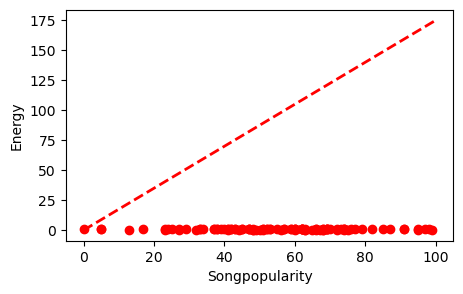

In [122]:
sample_size = 100 
sample_data = dfmusica3.sample(n=sample_size, random_state=42) 
plt.figure(figsize=(5, 3))

plt.scatter(sample_data['Songpopularity'], sample_data['Energy'], color='red')
plt.xlabel("Songpopularity")
plt.ylabel("Energy")

plt.plot([0, 100], [0, 175], color='red', linestyle='--', linewidth=2, label='Example Line')
plt.show()

<h4 Style="color:#008080"> Acousticness. </h4>

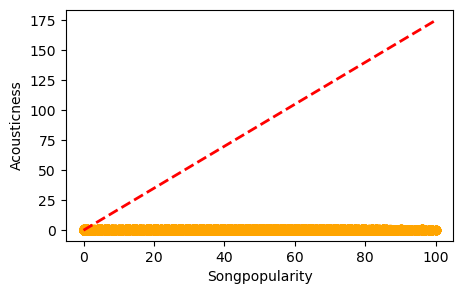

In [123]:
plt.figure(figsize=(5, 3))

plt.scatter(dfmusica3.Songpopularity	, dfmusica3.Acousticness,  color='orange')
plt.xlabel("Songpopularity")
plt.ylabel("Acousticness")

plt.plot([0, 100], [0, 175], color='red', linestyle='--', linewidth=2, label='Example Line')
plt.show()

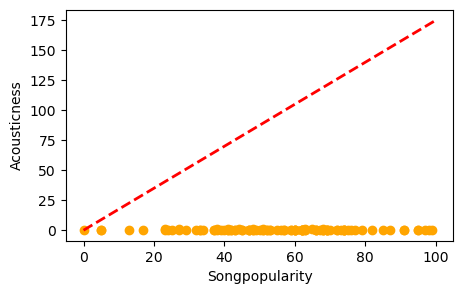

In [124]:
sample_size = 100
sample_data = dfmusica3.sample(n=sample_size, random_state=42) 
plt.figure(figsize=(5, 3))

plt.scatter(sample_data['Songpopularity'], sample_data['Acousticness'], color='orange')
plt.xlabel("Songpopularity")
plt.ylabel("Acousticness")

plt.plot([0, 100], [0, 175], color='red', linestyle='--', linewidth=2, label='Example Line')
plt.show()

<h4 Style="color:#008080"> Spechnesss. </h4>

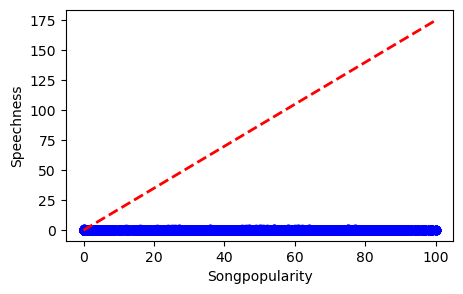

In [125]:
plt.figure(figsize=(5, 3))

plt.scatter(dfmusica3.Songpopularity	, dfmusica3.Speechness,  color='blue')
plt.xlabel("Songpopularity")
plt.ylabel("Speechness")

plt.plot([0, 100], [0, 175], color='red', linestyle='--', linewidth=2, label='Example Line')
plt.show()

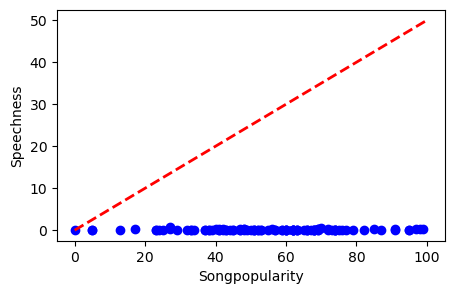

In [126]:
sample_size = 100
sample_data = dfmusica3.sample(n=sample_size, random_state=42) 
plt.figure(figsize=(5, 3))

plt.scatter(sample_data['Songpopularity'], sample_data['Speechness'], color='blue')
plt.xlabel("Songpopularity")
plt.ylabel("Speechness")

plt.plot([0, 100], [0, 50], color='red', linestyle='--', linewidth=2, label='Example Line')

plt.show()

<h4 Style="color:#008080"> Tempo. </h4>

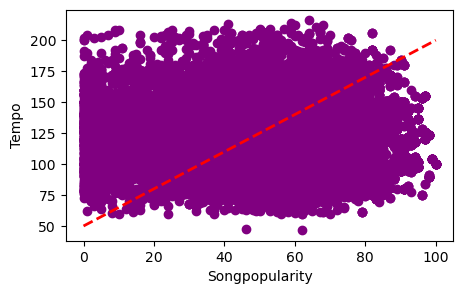

In [127]:
plt.figure(figsize=(5, 3))

plt.scatter(dfmusica3.Songpopularity	, dfmusica3.Tempo,  color='purple')
plt.xlabel("Songpopularity")
plt.ylabel("Tempo")

plt.plot([0, 100], [50, 200], color='red', linestyle='--', linewidth=2, label='Example Line')
plt.show()

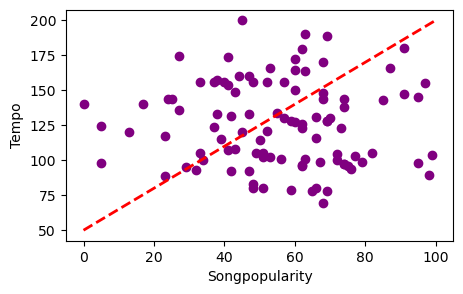

In [128]:
sample_size = 100
sample_data = dfmusica3.sample(n=sample_size, random_state=42) 
plt.figure(figsize=(5, 3))

plt.scatter(sample_data['Songpopularity'], sample_data['Tempo'], color='purple')
plt.xlabel("Songpopularity")
plt.ylabel("Tempo")

plt.plot([0, 100], [50, 200], color='red', linestyle='--', linewidth=2, label='Example Line')
plt.show()

<p Style="text-align: justify"> Se decidió utilizar la variable Danceabillty porque presenta la mejor dispersión según los gráficos previos.</p>

<h4 Style="color:#008080"> 5.1.2 Preparación del modelo de regresión lineal simple. </h4>

In [ ]:
#Danceability

<p Style="text-align: justify"> El siguiente paso consistió en dividir el dataframe depurado (dfmusica3) en dos tractos. El primero fue el de entrenamiento con el 80% de los datos y el segundo 20% para test.</p>

In [129]:
msk = np.random.rand(len(dfmusica3)) < 0.80
train = dfmusica3[msk]
test = dfmusica3[~msk]

<p Style="text-align: justify"> Se verificó la variable seleccionada para comprobar que el segmento de entrenamiento posee la dispersión buscada para construir el modelo de regresión.</p>

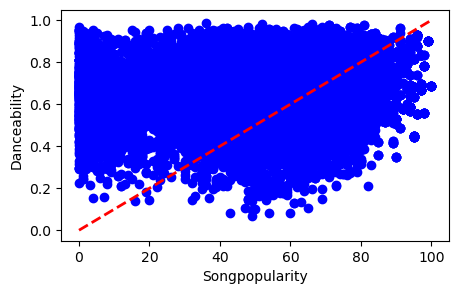

In [130]:
plt.figure(figsize=(5, 3))

plt.scatter(train.Songpopularity, train.Danceability,  color='blue')
plt.xlabel("Songpopularity")
plt.ylabel("Danceability")

plt.plot([0, 100], [0, 1], color='red', linestyle='--', linewidth=2, label='Example Line')
plt.show()

<h4 Style="color:#008080"> 5.1.3 Generación del modelo de regresión lineal simple. </h4>

<p Style="text-align: justify"> El siguiente paso fue generar el modelo de regresión lineal simple con el 80% de dataset para la variable seleccionada (Danceability). Si bien la variable Danceability es la que presentó la mejor dispersión, se quiso comprobar de esta forma que efectivamente es la mejor variable predictora, o bien seleccionar alguna otra variable para el modelo en caso de que el menor MAE, MSE y el mayor R2-score estuviera en alguna de las variables no seleccionadas. Cabe destacar que este proceso se repitió con cada una de las posible variables deseables para el modelo, sin embargo ninguna arrojó un R2-score alto. Seguidamente el análisis para la variable Danceability:</p>

<h4 Style="color:#008080"> Danceability. </h4>

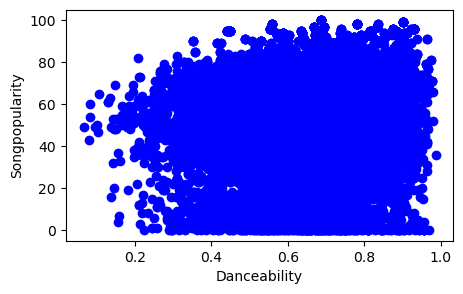

In [131]:
plt.figure(figsize=(5, 3))
plt.scatter( train.Danceability, train.Songpopularity,  color='blue')
plt.xlabel("Danceability")
plt.ylabel("Songpopularity")
plt.show()

In [132]:
regr = linear_model.LinearRegression()
train_x = np.asanyarray(train[['Danceability']])
train_y = np.asanyarray(train[['Songpopularity']])
regr.fit(train_x, train_y)

print ('Coeficiente: ', regr.coef_)
print ('Intercepto: ',regr.intercept_)

Coeficiente:  [[13.89520654]]
Intercepto:  [44.31420865]


In [133]:
test_x = np.asanyarray(test[['Danceability']])
test_y = np.asanyarray(test[['Songpopularity']])
test_y_ = regr.predict(test_x)

print("Mean absolute error: %.2f" % np.mean(np.absolute(test_y_ - test_y)))
print("Residual sum of squares (MSE): %.2f" % np.mean((test_y_ - test_y) ** 2))
print("R2-score: %.2f" % r2_score(test_y , test_y_) )

Mean absolute error: 17.46
Residual sum of squares (MSE): 486.54
R2-score: 0.01


<p Style="text-align: justify"> Basándonos en los valores obtenidos se puede notar que la variable Danceability tiene el menor MAE (17.73), el menor MSE (493.72) y el mayor R2-score (0.01) entre todas las variables evaluadas. Esto sugiere que, en esta función de regresión lineal simple, la variable Danceability tiene un mejor rendimiento en comparación con las otras variables evaluadas, lo cual confirma el análisis realizado por medio de la observación de los gráficos de dispersión para cada variable.

<h4 Style="color:#008080"> 5.1.4 Visualización de los resultados. </h4>

<p Style="text-align: justify"> Con los resultados obtenidos se generó una visualización comparativa de las predicciones versus los datos actuales, considerando que el modelo es capaz de explicar el 1% de las observaciones del set de datos.

In [134]:
dfmusica4 = pd.DataFrame({'Actual': test_y.flatten(), 'Predicted': test_y_.flatten()})
dfmusica4.head(10)

,Actual,Predicted
0,81.0,51.845411
1,78.0,53.054294
2,81.0,52.901446
3,79.0,53.443359
4,77.0,47.329468
5,75.0,51.234022
6,73.0,53.971377
7,62.0,47.732429
8,72.0,52.137210
9,67.0,47.273888


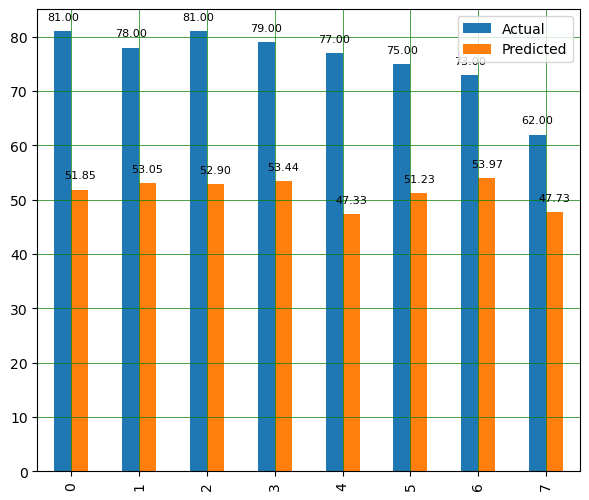

In [178]:
dfmusica5 = dfmusica4.head(8)

ax = dfmusica5.plot(kind='bar', figsize=(7, 6))

for p in ax.patches:
    ax.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=8, xytext=(0, 10), textcoords='offset points')

plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')

plt.show()

<p Style="text-align: justify"> Tanto el R2-score obtenido, así como las diferencias entre la predicción y el actual, nos indican que al menos para realizar regresión lineal simple, el set de datos no es apto para el objetivo perseguido que es: predecir la popularidad de las canciones.

<h4 Style="color:#008080"> 5.2 Regresión lineal múltiple. </h4>

<p Style="text-align: justify"> Dado lo anterior, se elaboró una regresión lineal múltiple con las variables que presentaban distribución normal al momento de la revisión inicial.

In [136]:
dfmusica3.head(9)

,Danceability,Energy,Acousticness,Speechness,Tempo,Songpopularity
0,0.496,0.682,0.005520,0.0294,167.060,73.0
1,0.542,0.853,0.010300,0.0498,105.256,66.0
2,0.737,0.463,0.008170,0.0792,123.881,76.0
3,0.451,0.970,0.026400,0.1070,122.444,74.0
4,0.447,0.766,0.000954,0.0313,172.011,56.0
5,0.316,0.945,0.008950,0.1240,189.931,80.0
6,0.581,0.887,0.000504,0.0624,90.578,81.0
7,0.613,0.953,0.001480,0.0855,105.046,76.0
8,0.330,0.936,0.001080,0.0917,148.112,80.0


<p Style="text-align: justify"> Se obtuvo el valor de la variable dependiente "Songpopularity", así como las variables independientes: "Danceability", " Energy", "Acousticness", "Speechness" y "Tempo", para este caso.

In [155]:
from sklearn import linear_model
regr = linear_model.LinearRegression()
x = np.asanyarray(train[['Danceability','Energy','Acousticness','Speechness','Tempo']])
y = np.asanyarray(train[['Songpopularity']])
regr.fit (x, y)

print ('Coefficients: ', regr.coef_)

Coefficients:  [[ 1.15438442e+01 -6.63938466e+00 -7.54998539e+00  5.76820301e-01
  -9.15843782e-03]]


<p Style="text-align: justify"> Se generó los valores R Score y Error cuadrático medio.

In [157]:
regr = linear_model.LinearRegression()

regr.fit(train[['Danceability', 'Energy', 'Acousticness', 'Speechness', 'Tempo']], train['Songpopularity'])

y_hat = regr.predict(test[['Danceability', 'Energy', 'Acousticness', 'Speechness', 'Tempo']])

mse = np.mean((y_hat - test['Songpopularity']) ** 2)
print("Residual sum of squares (MSE): %.2f" % mse)

r2_score = regr.score(test[['Danceability', 'Energy', 'Acousticness', 'Speechness', 'Tempo']], test['Songpopularity'])
print('Variance score (R^2): %.2f' % r2_score)

Residual sum of squares (MSE): 484.90
Variance score (R^2): 0.02


<p Style="text-align: justify"> Se generó la tabla de predicciones paralas primeras 8 observaciones.

In [159]:
dfmusica6 = pd.DataFrame({'Actual': y.flatten(), 'Predicted': y_hat.flatten()})
dfmusica6.head(10)

,Actual,Predicted
0,81.0,51.925611
1,78.0,52.594351
2,81.0,53.024140
3,79.0,51.197542
4,77.0,48.713870
5,75.0,52.473605
6,73.0,54.471625
7,62.0,49.266740
8,72.0,52.930072
9,67.0,47.836969


<p Style="text-align: justify"> Se graficó las predicciones.

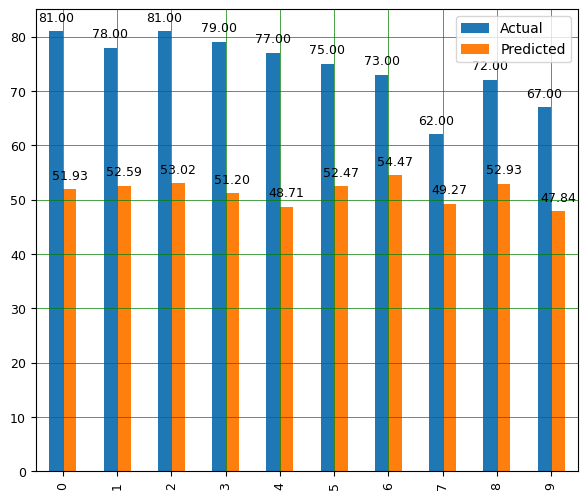

In [176]:
df1 = df.head(10)

ax = df1.plot(kind='bar', figsize=(7, 6))
ax.tick_params(axis='both', which='major', labelsize=12)  

for p in ax.patches:
    ax.annotate('{:.2f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points', fontsize=9)  

plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')

plt.xticks(fontsize=9) 
plt.yticks(fontsize=9) 

plt.show()

<p Style="text-align: justify"> Finalmente se llegó a la conclusión de que si bien las predicciones mejoran respecto a los resultados obtenidos bajo regresión lineal simple, lo cierto es que las diferencias exitentes en relación con los datos reales son muy elevadas lo que nos lleva a pensar que la información contenida en la base de datos no es lo suficientemente precisa como para determinar por medio de estas técnicas de pronóstico, cuáles de las canciones de la lista tienen potencial de ser más populares, con un nivel razonable de confianza.